BD_374417_g, BD_374417_r, BD_292091_g, BD_292091_r, BD_541216_g, BD_541216_r, BD_750325_g, BD_750325_r, 
BD_210607_g, BD_210607_r, BD_710031_g, BD_710031_r

Plots the fits files and identify peaks with a red dot

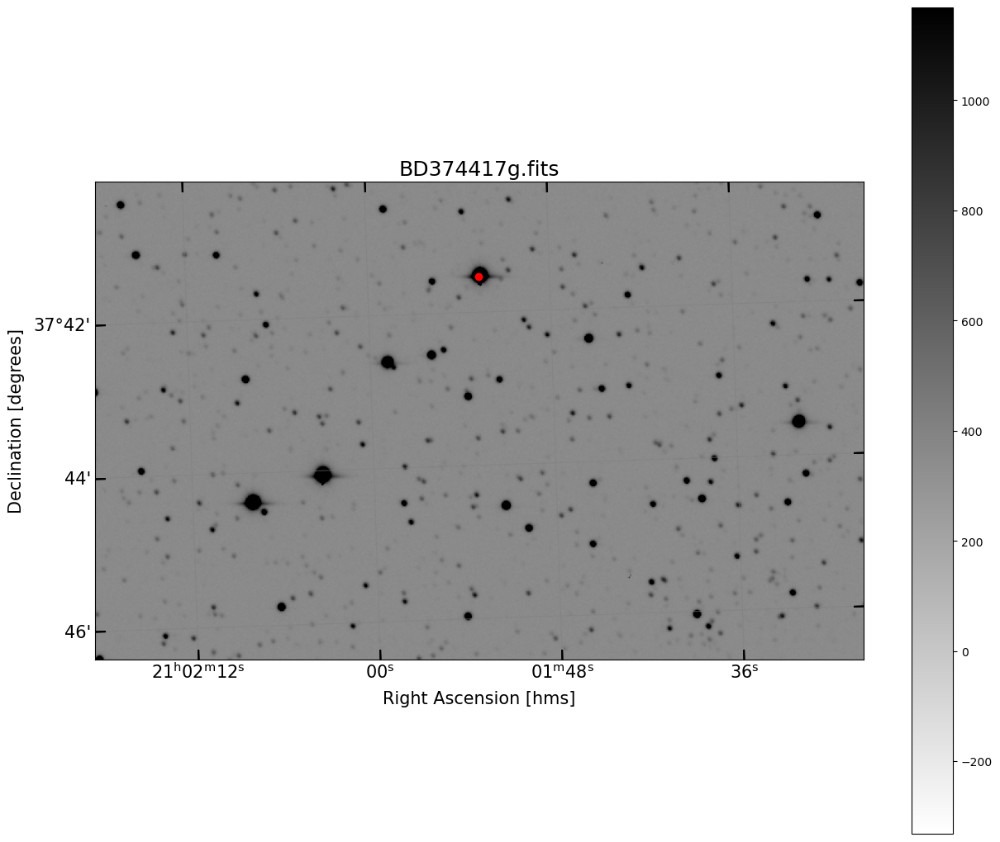

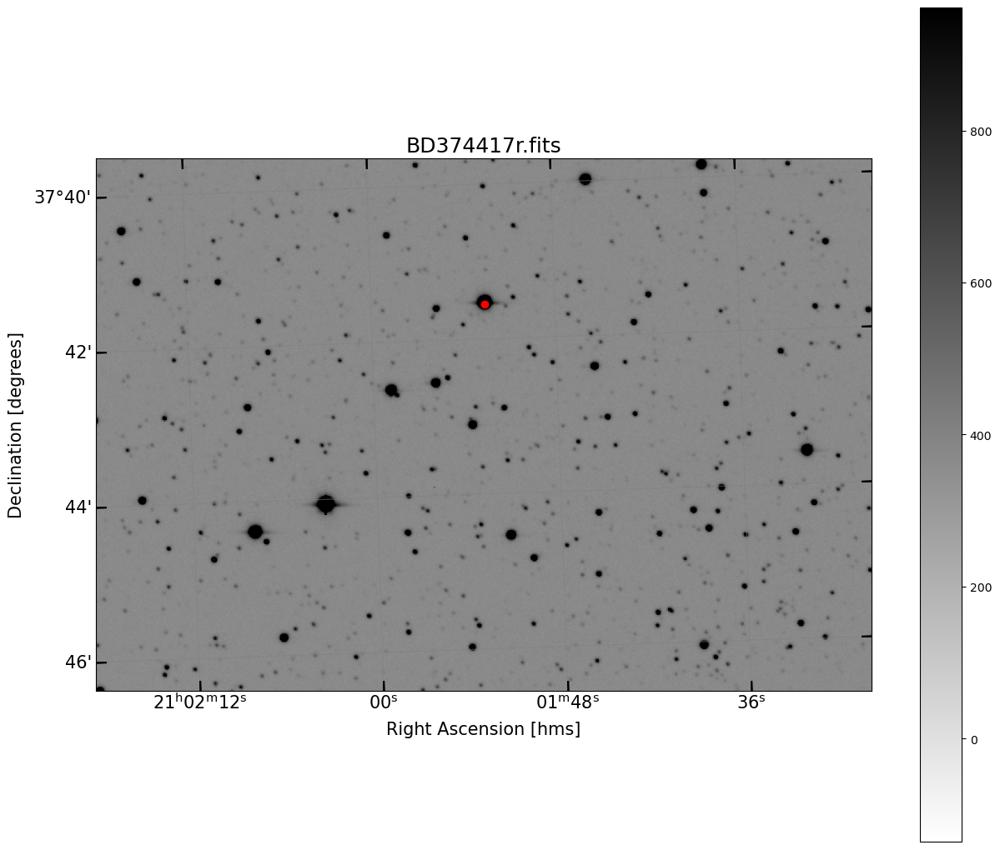

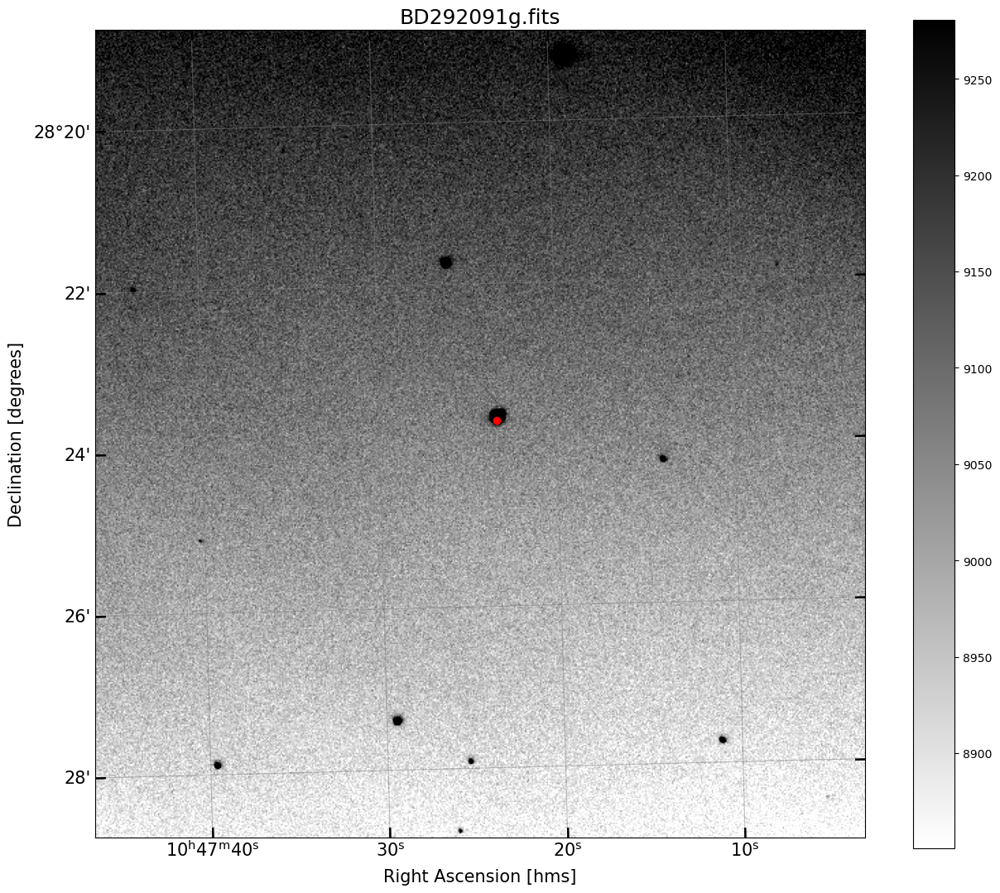

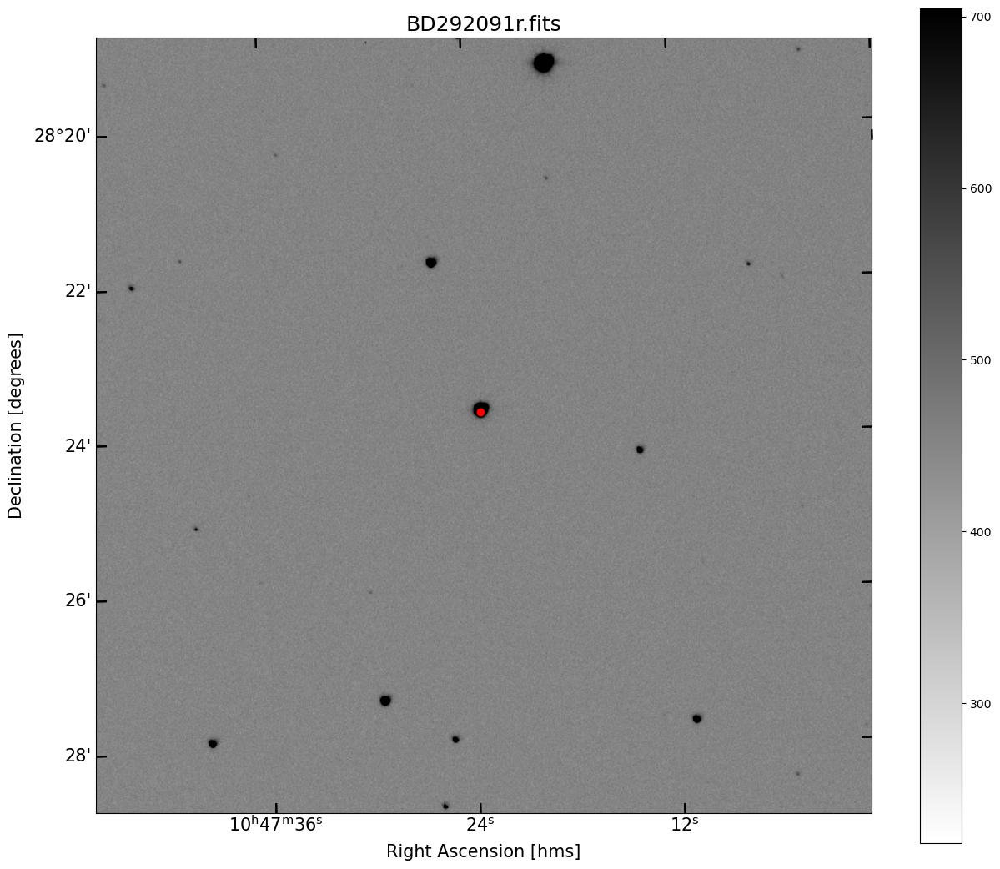

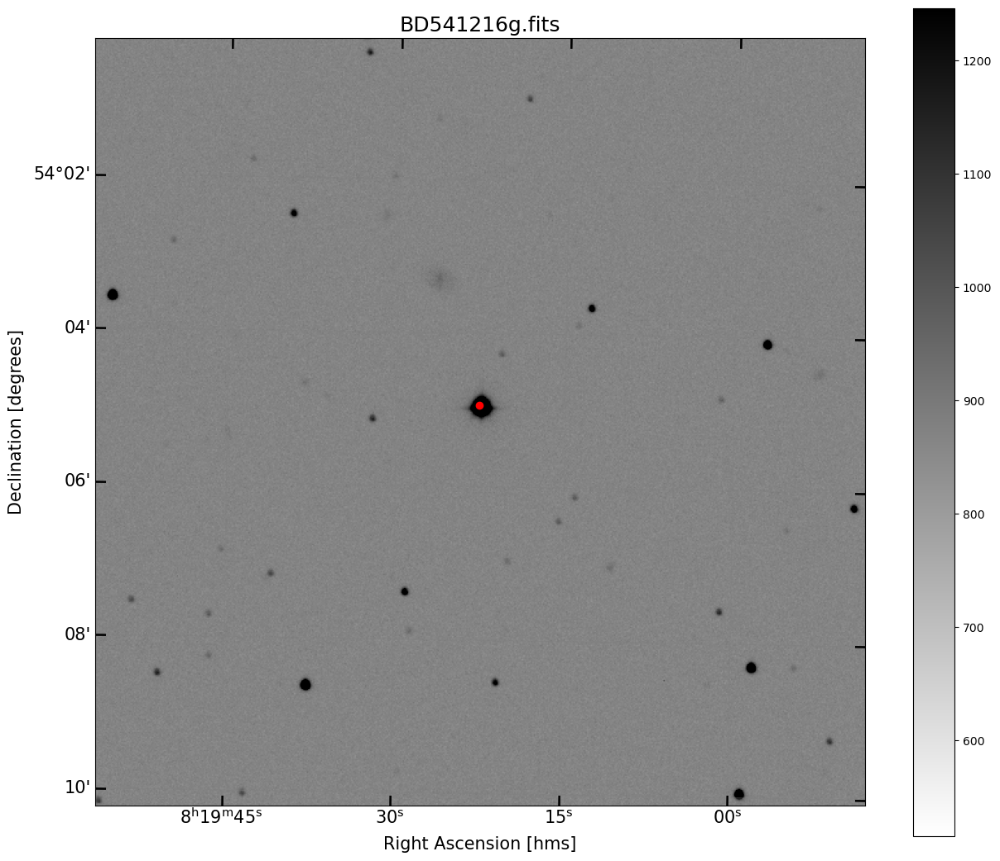

...

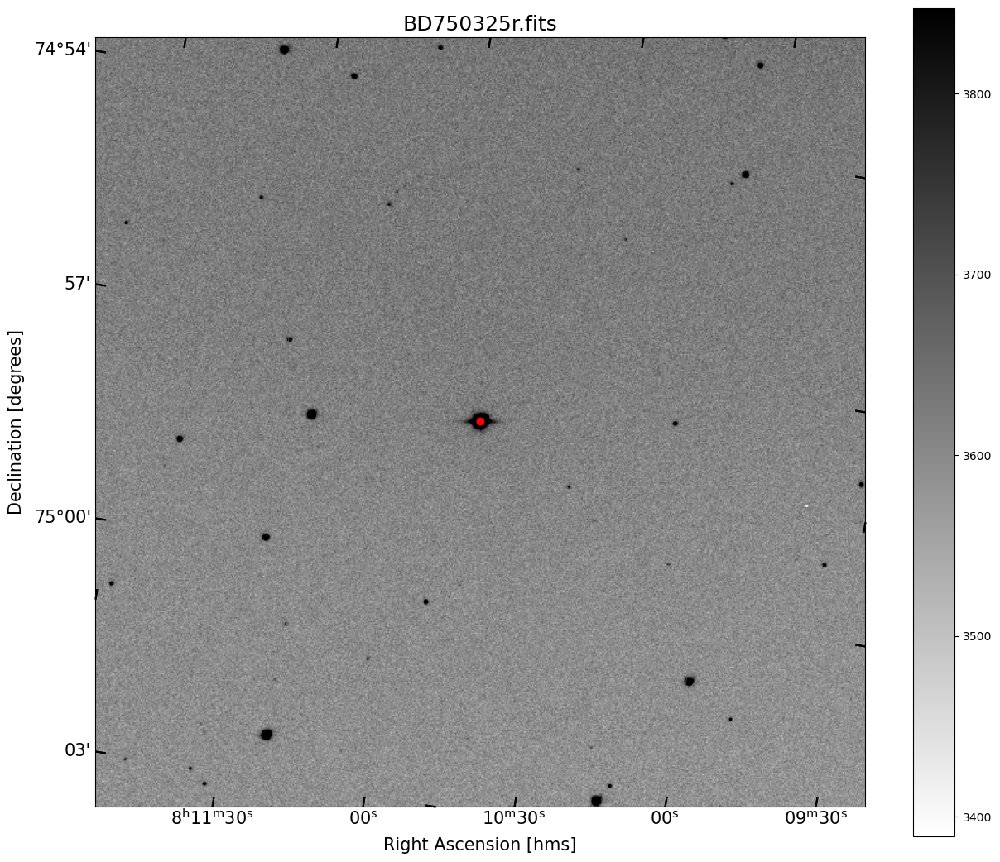

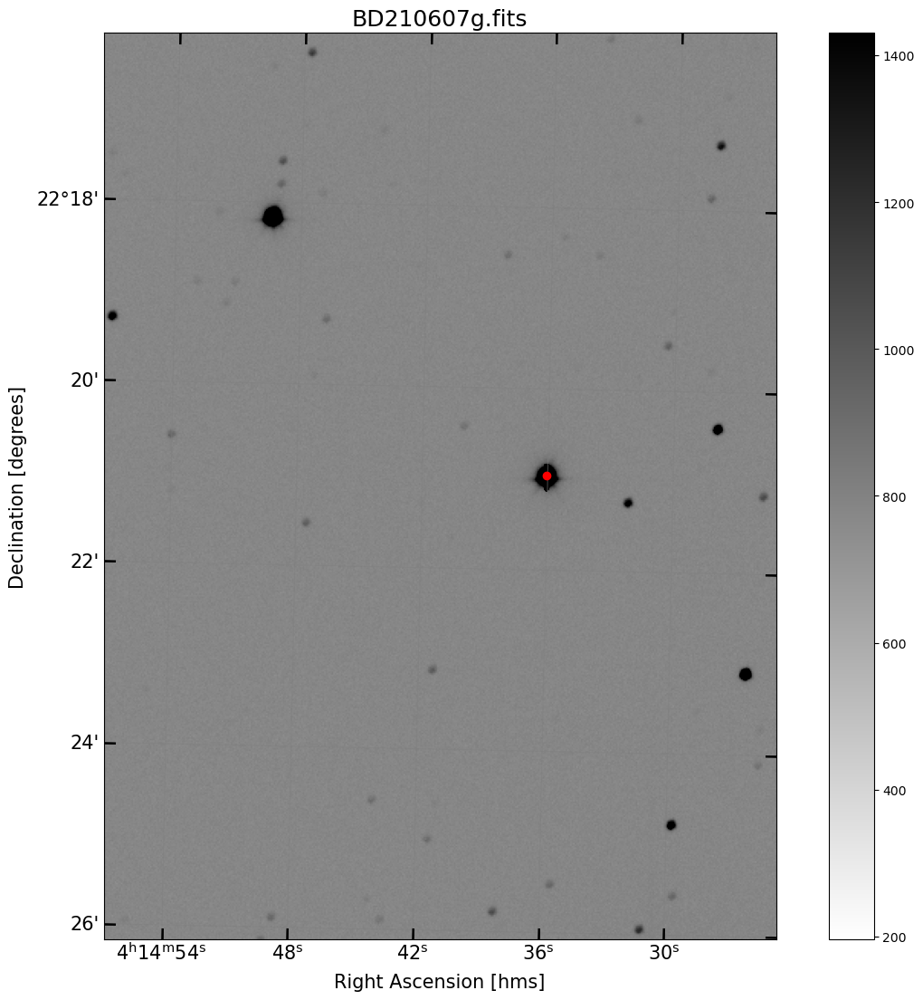

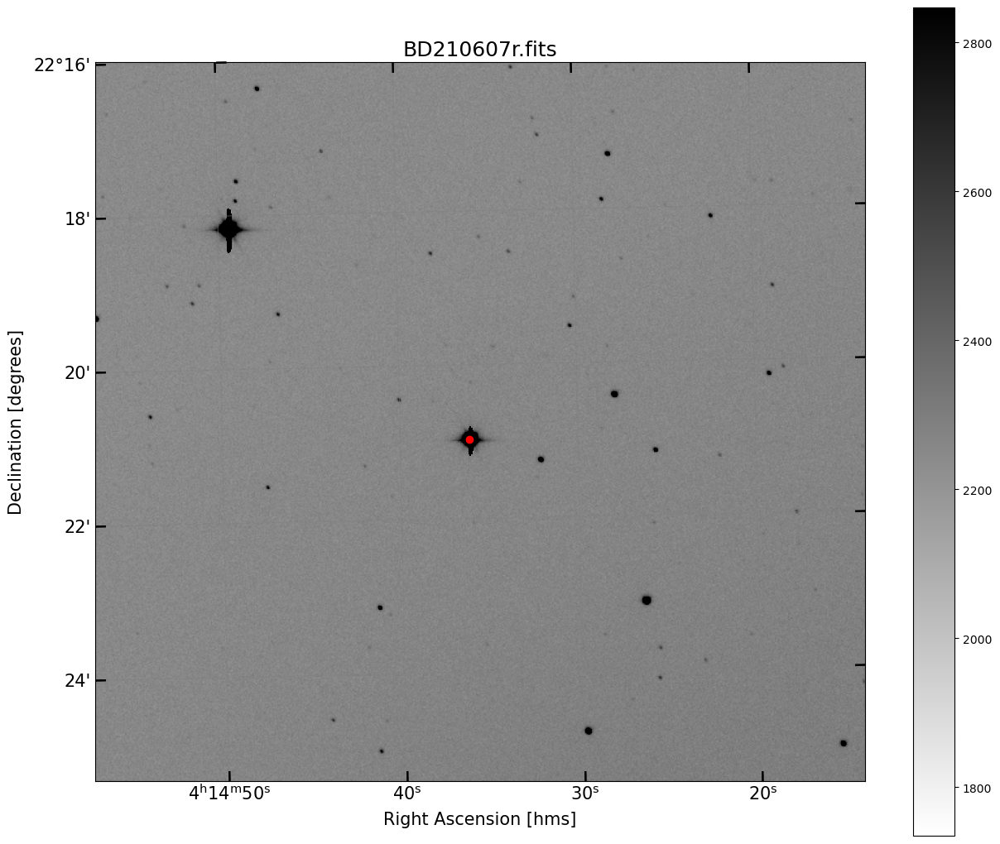

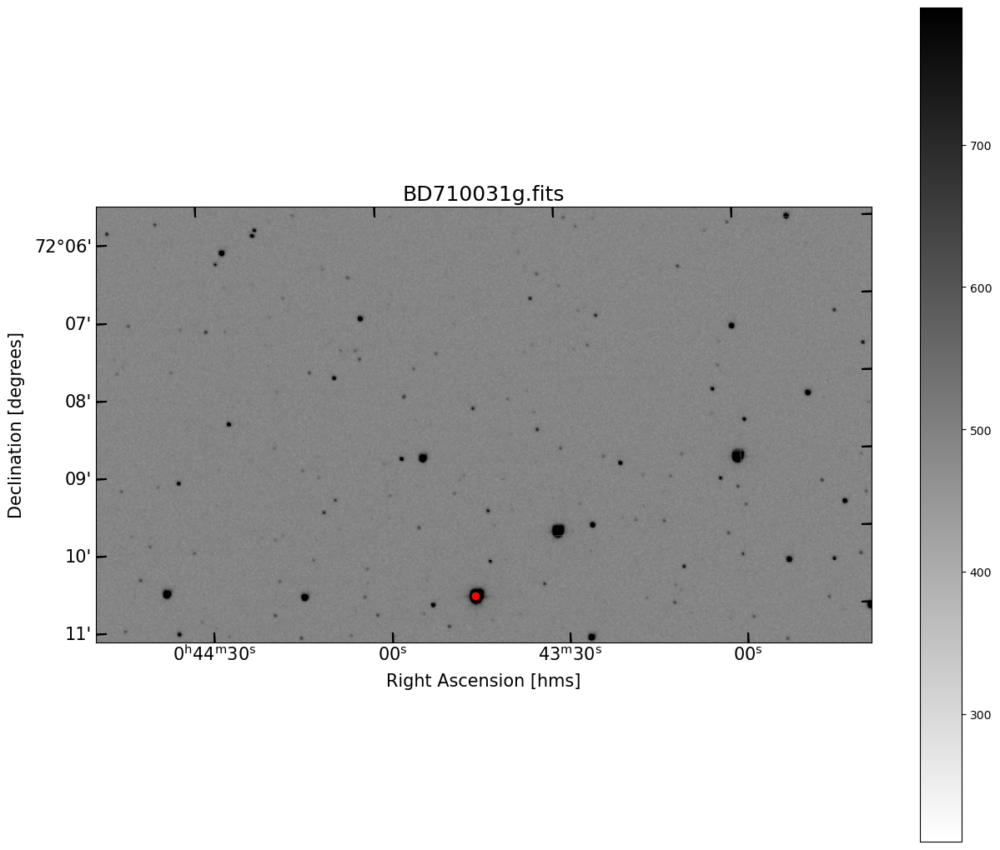

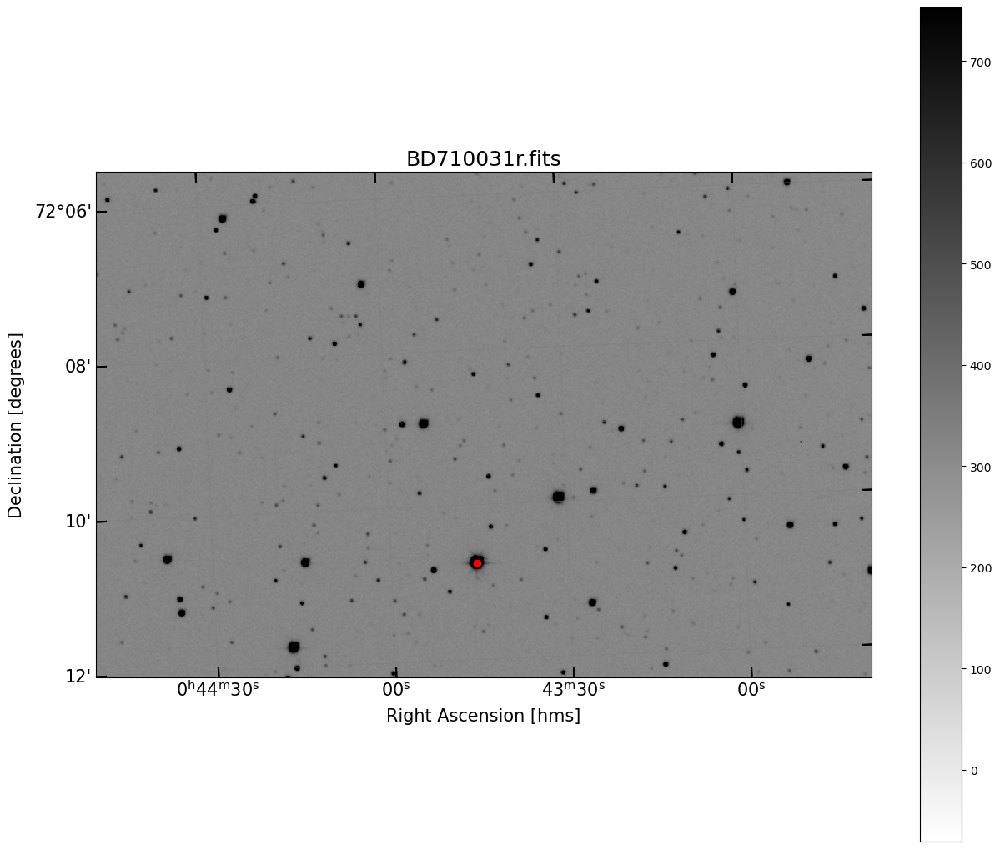

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS

# Strip SIP distortion terms from header
def strip_SIP(header):
    A_prefixes = [i for i in header.keys() if i.startswith('A_')]
    B_prefixes = [i for i in header.keys() if i.startswith('B_')]
    for a, b in zip(A_prefixes, B_prefixes):
        del header[a]
        del header[b]
    return header

# Function to load multiple FITS files
def load_multiple_fits(fits_files):
    fits_data = {}
    for file in fits_files:
        with fits.open(file) as hdul:
            data = hdul[0].data
            header = hdul[0].header
            fits_data[file] = (data, header)
    return fits_data

# Define image plotting function with WCS support
def implot(image, figsize=(15, 13), cmap='gray_r', scale=0.5, colorbar=False, header=None, wcs=None, **kwargs):
    if header is None and wcs is None:
        fig, ax = plt.subplots(figsize=figsize)
    elif wcs is not None:
        fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': wcs})
        ax.set_xlabel('Right Ascension [hms]', fontsize=15)
        ax.set_ylabel('Declination [degrees]', fontsize=15)
        ax.coords.grid(color='grey', alpha=0.5, linestyle='solid')
    elif header is not None:
        wcs = WCS(header)
        fig, ax = plt.subplots(figsize=figsize, subplot_kw={'projection': wcs})
        ax.set_xlabel('Right Ascension [hms]', fontsize=15)
        ax.set_ylabel('Declination [degrees]', fontsize=15)
        ax.coords.grid(color='grey', alpha=0.5, linestyle='solid')
    
    mu = np.mean(image)
    s = np.std(image)
    vmin = kwargs.get('vmin', mu - scale * s)
    vmax = kwargs.get('vmax', mu + scale * s)
    im = ax.imshow(image, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)
    
    if colorbar:
        plt.colorbar(im, ax=ax)
    ax.tick_params(direction='in', length=9, width=1.5, labelsize=15)
    
    return fig, ax

# List of FITS files
fits_files = [
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216g.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031r.fits'
]

# Coordinates for each FITS file, these were found from the peak finder
# Coordinates are flipped in the process and need to be reversed. Commented numbers are actual (for reference)
coordinates = {
    'BD374417g.fits': (296, 296), # (296, 294)
    'BD374417r.fits': (295, 297), # (297, 295)
    'BD292091g.fits': (306, 294), # (294, 306)
    'BD292091r.fits': (307, 294), # (294, 307)
    'BD541216g.fits': (309, 296), # (296, 309)
    'BD541216r.fits': (309, 297), # (297, 307)
    'BD750325g.fits': (297, 296), # (296, 297)
    'BD750325r.fits': (297, 296), # (296, 295)
    'BD210607g.fits': (303, 289), # (289, 303)
    'BD210607r.fits': (263, 288), # (288, 256)
    'BD710031g.fits': (35, 290),  # (290, 35)
    'BD710031r.fits': (87, 291),  # (291, 87)
}

# Load FITS files
fits_data = load_multiple_fits(fits_files)

# Process each FITS file and plot the coordinates
for file, (data, header) in fits_data.items():
    # Strip SIP distortion terms
    header = strip_SIP(header)
    
    # Initialize WCS from the header
    wcs = WCS(header)
    
    # Plot the image with WCS
    fig, ax = implot(data, header=header, wcs=wcs, colorbar=True)
    ax.set_title(file.split('/')[-1], fontsize=18)
    
    # Get coordinates for the current file
    y, x = coordinates.get(file.split('/')[-1], (None, None))
    
    if x is not None and y is not None:
        # Plot the coordinate with a red dot and print coordinates in (x, y)
        ax.plot(x, y, 'ro')  # Red dot at each specified coordinate
        #print(f"{file.split('/')[-1]} - Peak at (x, y): ({x}, {y})") # Uncomment to also print x, y coordinates
    
    plt.show()


plots a cutout around each identifed science star

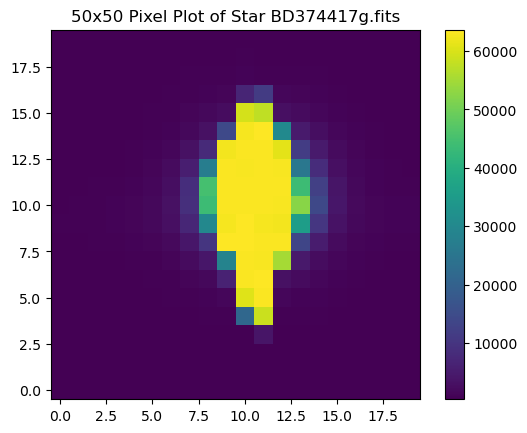

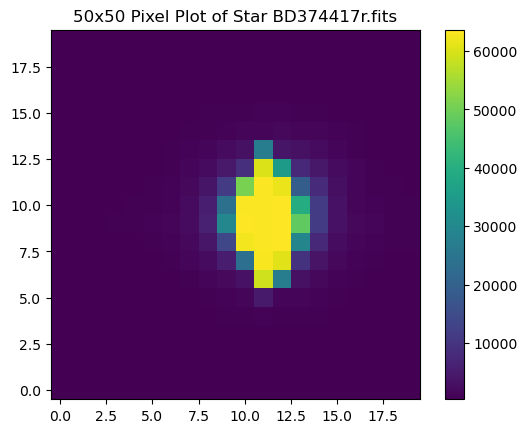

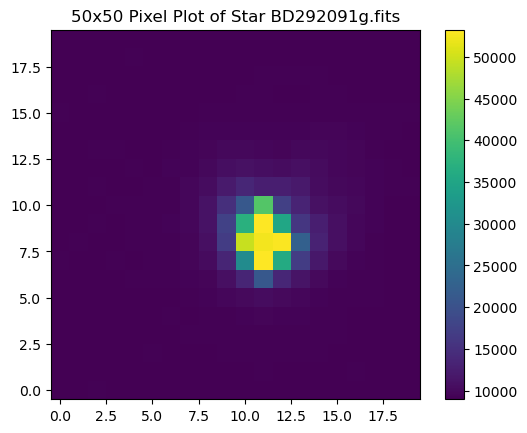

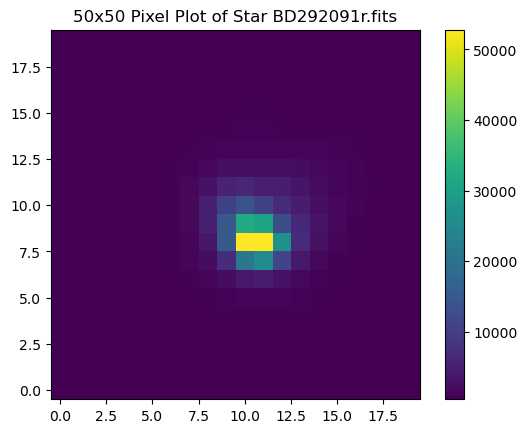

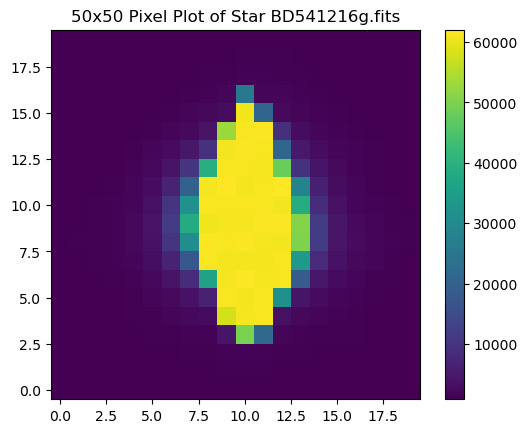

...

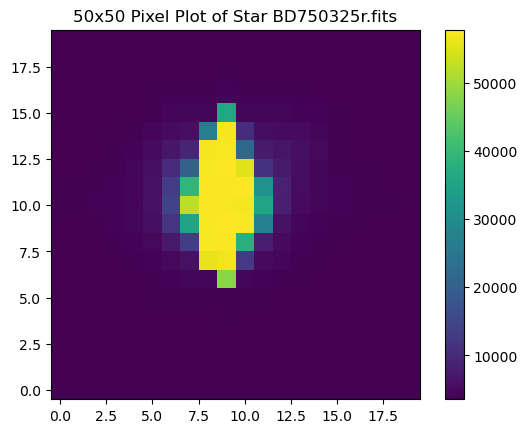

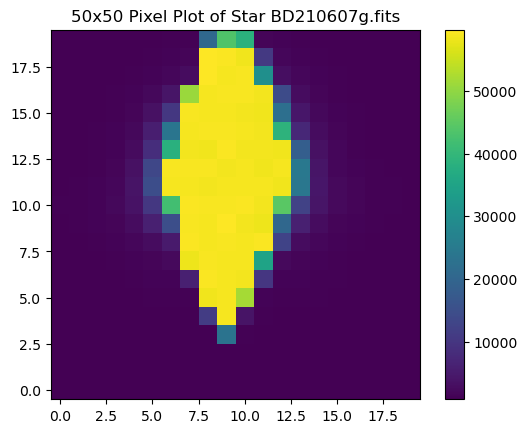

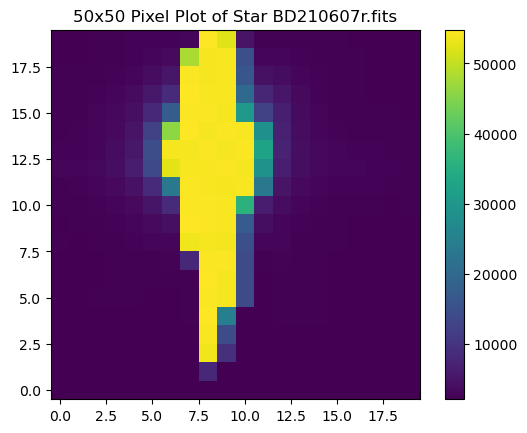

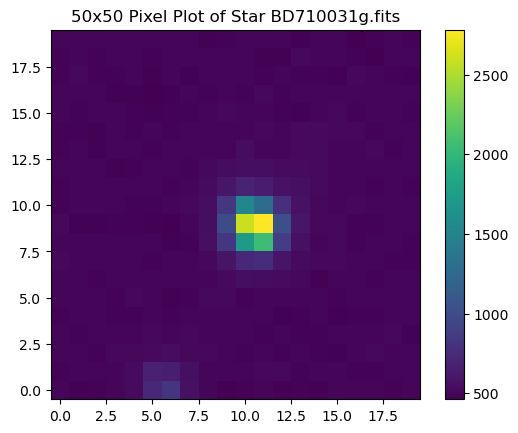

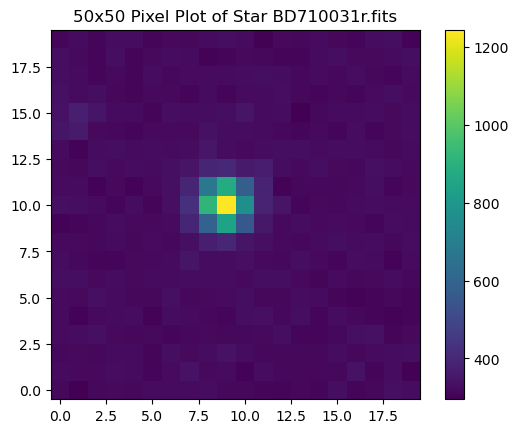

In [33]:
import matplotlib.pyplot as plt
from astropy.io import fits

# List of FITS files and coordinates
fits_files = [
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216g.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031r.fits'
]

# Coordinates for each FITS file
coordinates = {
    'BD374417g.fits': (296, 296),
    'BD374417r.fits': (295, 297),
    'BD292091g.fits': (293, 309), 
    'BD292091r.fits': (293, 309), 
    'BD541216g.fits': (297, 308), 
    'BD541216r.fits': (298, 308), 
    'BD750325g.fits': (297, 296),
    'BD750325r.fits': (297, 296),
    'BD210607g.fits': (290, 300), 
    'BD210607r.fits': (290, 260), 
    'BD710031g.fits': (95, 298), 
    'BD710031r.fits': (85, 290),
}

# Function to plot image centered at given coordinates
def plot_image_centered_at_coordinates(fits_file, pk):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data

    x_center, y_center = pk
    
    # Define the region of interest around the centroid (50x50 pixels)
    x_min = int(x_center) - 10
    x_max = int(x_center) + 10
    y_min = int(y_center) - 10
    y_max = int(y_center) + 10
    
    # Ensure the indices are within bounds
    x_min = max(0, x_min)
    x_max = min(data.shape[1], x_max)
    y_min = max(0, y_min)
    y_max = min(data.shape[0], y_max)
    
    # Plot the region of interest
    plt.imshow(data[y_min:y_max, x_min:x_max], origin='lower', cmap='viridis')
    plt.colorbar()
    plt.title(f"50x50 Pixel Plot of Star {fits_file.split('/')[-1]}")
    plt.show()

# Loop through each FITS file and plot the centered image
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        plot_image_centered_at_coordinates(fits_file, coordinates[file_name])


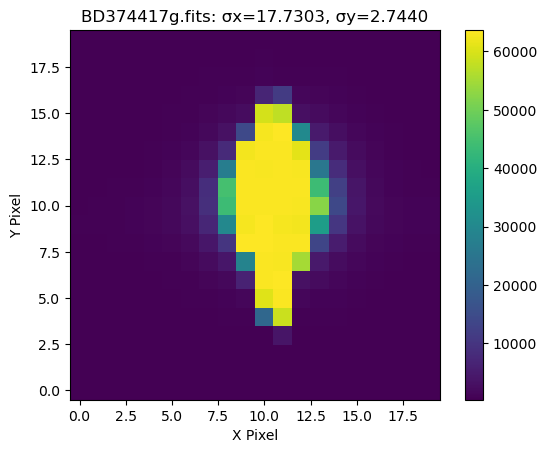

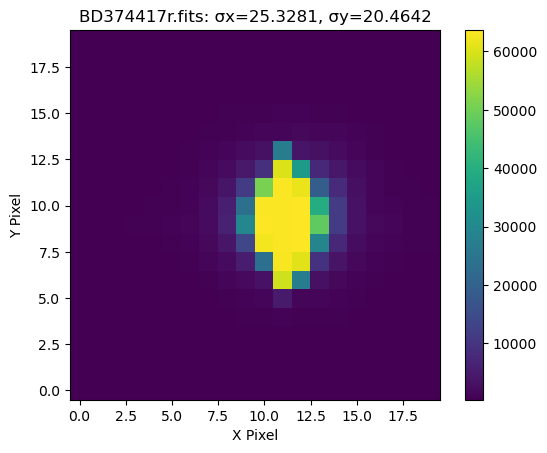

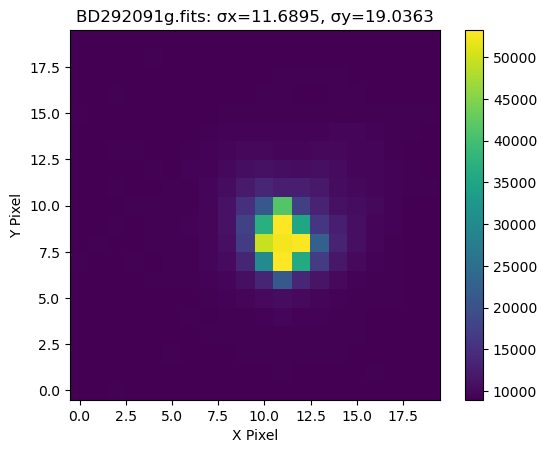

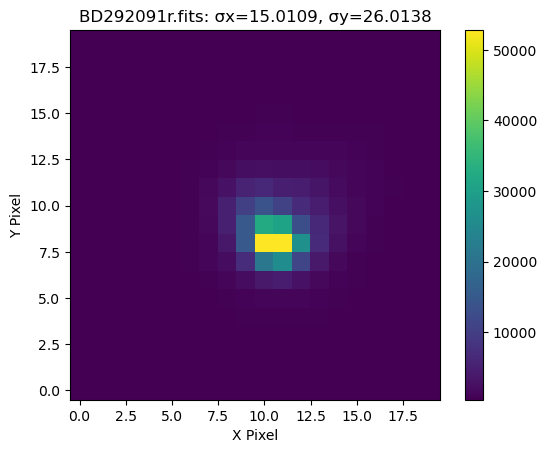

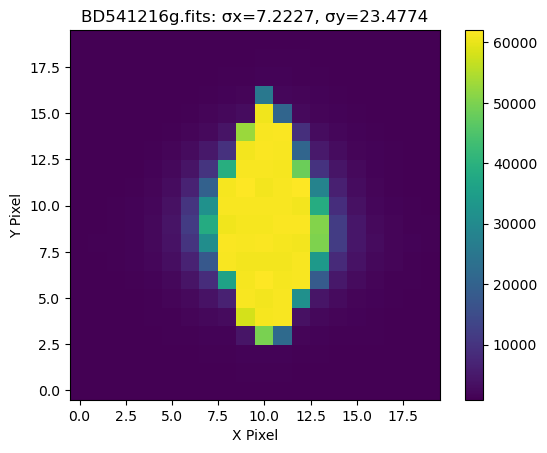

...

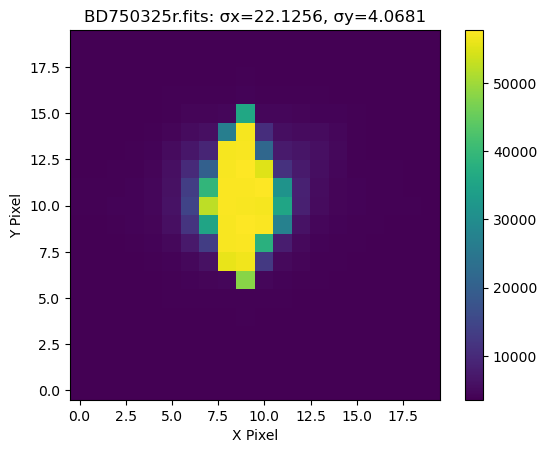

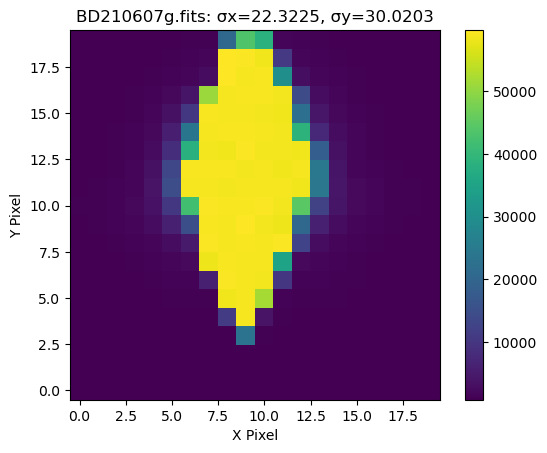

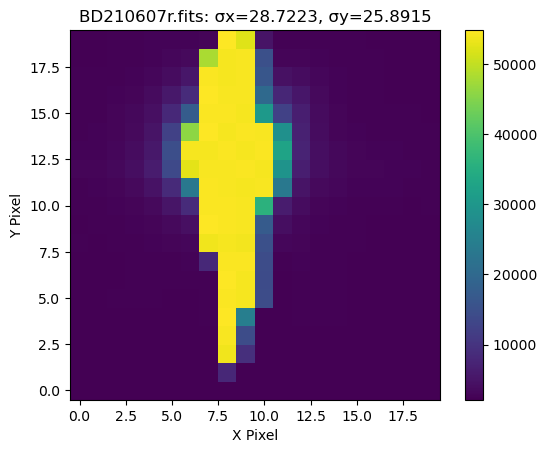

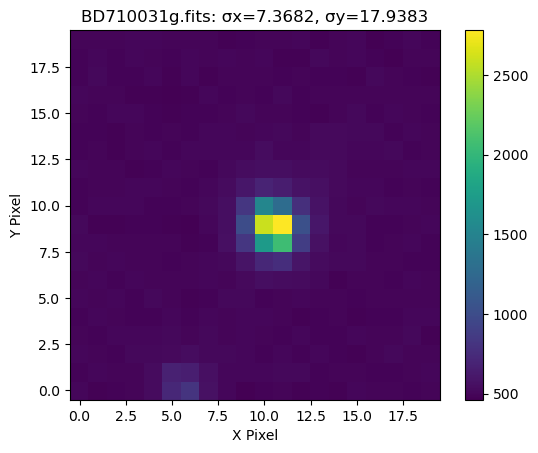

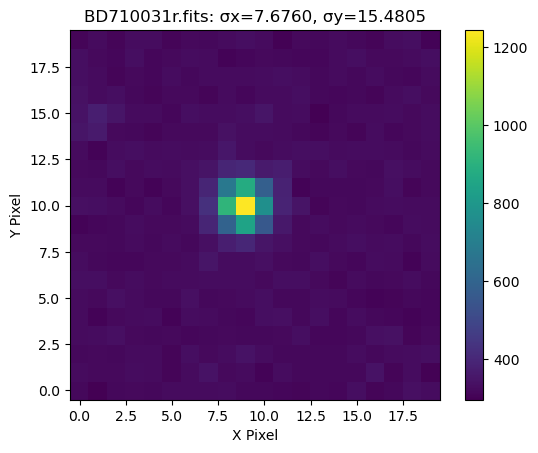

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# List of FITS files and their paths
fits_files = [
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216g.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031r.fits'
]

# Coordinates for each FITS file
coordinates = {
    'BD374417g.fits': (296, 296),
    'BD374417r.fits': (295, 297),
    'BD292091g.fits': (293, 309), 
    'BD292091r.fits': (293, 309), 
    'BD541216g.fits': (297, 308), 
    'BD541216r.fits': (298, 308), 
    'BD750325g.fits': (297, 296),
    'BD750325r.fits': (297, 296),
    'BD210607g.fits': (290, 300), 
    'BD210607r.fits': (290, 260), 
    'BD710031g.fits': (95, 298), 
    'BD710031r.fits': (85, 290),
}

# Function to find Gaussian moment
def find_moment(image, peak_x, peak_y, centroid_x, centroid_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(peak_x - boxwidth, peak_x + boxwidth),
                         np.arange(peak_y - boxwidth, peak_y + boxwidth))
    image_cutout = image[peak_y - boxwidth:peak_y + boxwidth, peak_x - boxwidth:peak_x + boxwidth]
    
    if np.sum(image_cutout) == 0:
        return np.nan, np.nan  # Return NaN if cutout is empty

    x_squared = np.sum((xx ** 2) * image_cutout) / np.sum(image_cutout)
    y_squared = np.sum((yy ** 2) * image_cutout) / np.sum(image_cutout)
    
    sigma_x = np.sqrt(np.abs(x_squared - (centroid_x ** 2)))
    sigma_y = np.sqrt(np.abs(y_squared - (centroid_y ** 2)))
    
    return sigma_x, sigma_y


# Function to plot image centered at given coordinates and display Gaussian moments
def plot_image_centered_at_coordinates(fits_file, pk):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data

    x_center, y_center = pk
    
    # Define the region of interest around the centroid (20x20 pixels)
    x_min = max(0, int(x_center) - 10)
    x_max = min(data.shape[1], int(x_center) + 10)
    y_min = max(0, int(y_center) - 10)
    y_max = min(data.shape[0], int(y_center) + 10)
    
    # Calculate Gaussian moments (sigma_x and sigma_y)
    sigma_x, sigma_y = find_moment(data, x_center, y_center, x_center, y_center, window=20)
    
    # Plot the region of interest
    plt.imshow(data[y_min:y_max, x_min:x_max], origin='lower', cmap='viridis')
    plt.colorbar()
    plt.title(f"{fits_file.split('/')[-1]}: σx={sigma_x:.4f}, σy={sigma_y:.4f}")
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.show()

# Loop through each FITS file, calculate moments, and plot centered image
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        plot_image_centered_at_coordinates(fits_file, coordinates[file_name])


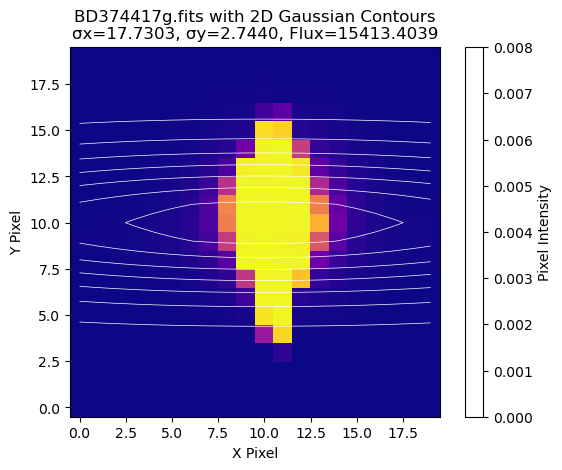

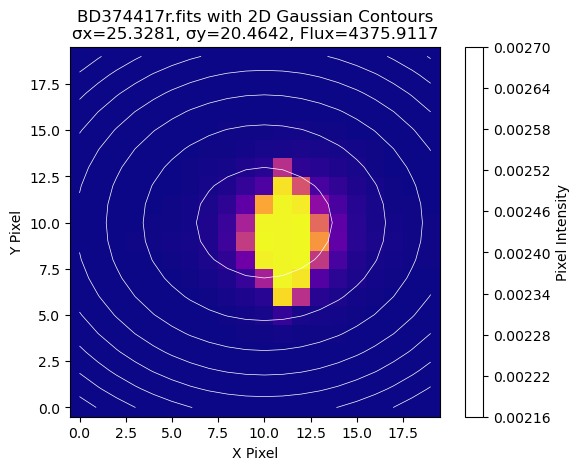

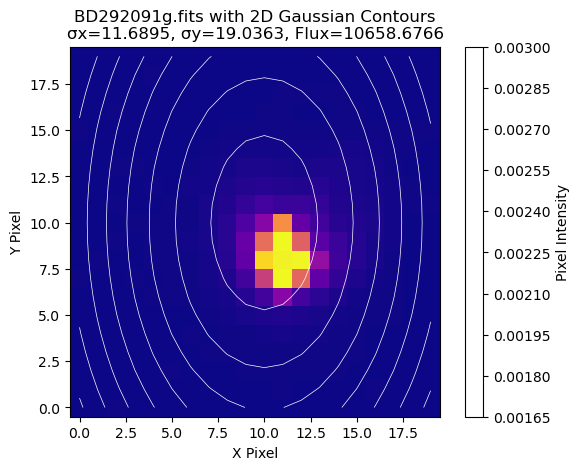

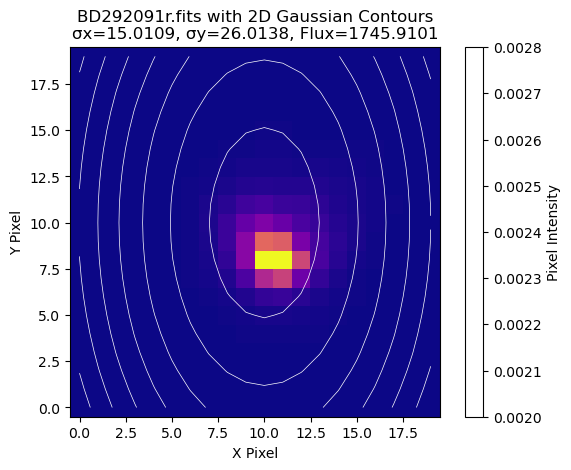

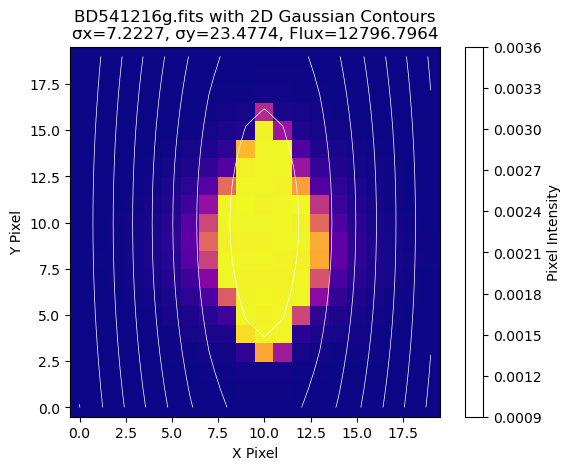

...

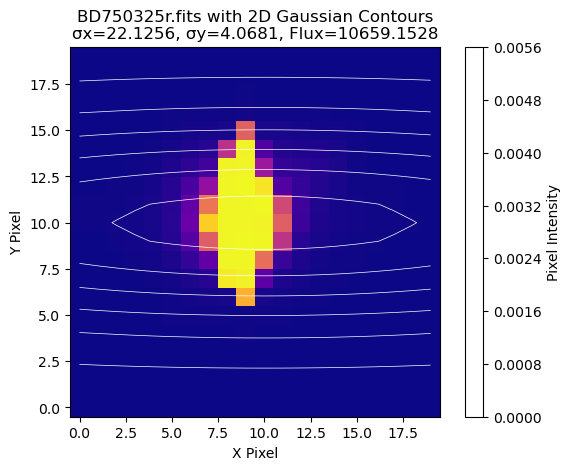

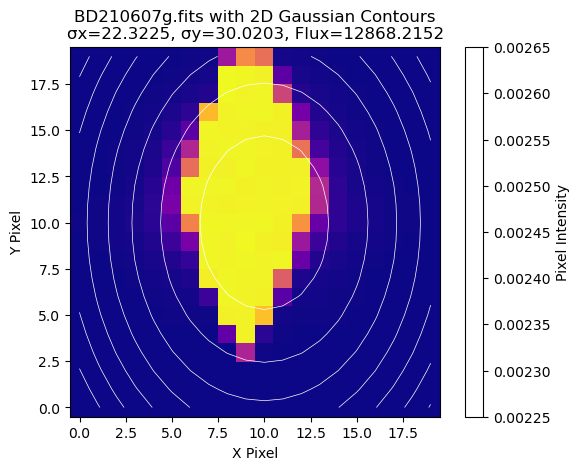

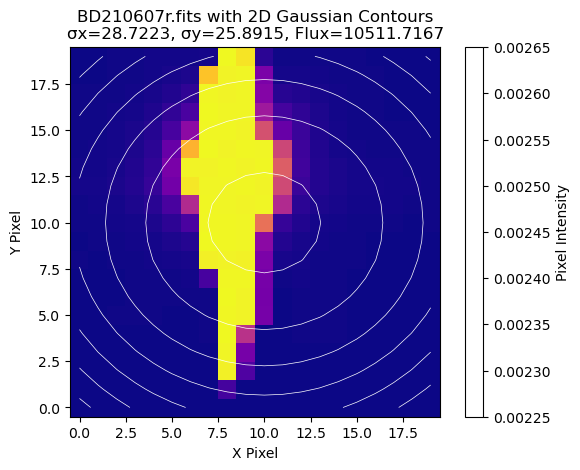

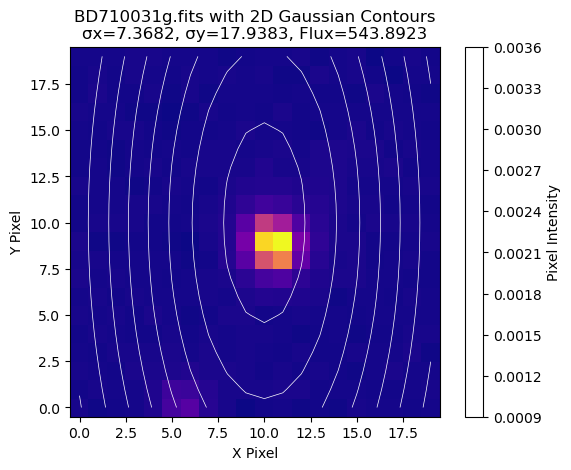

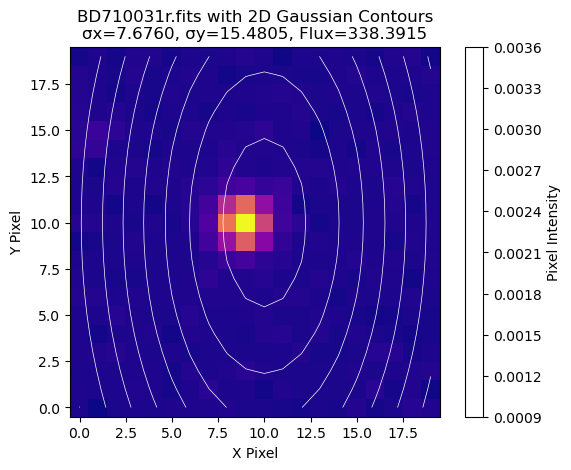

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# List of FITS files and their paths
fits_files = [
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216g.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031r.fits'
]

# Coordinates for each FITS file
coordinates = {
    'BD374417g.fits': (296, 296),
    'BD374417r.fits': (295, 297),
    'BD292091g.fits': (293, 309), 
    'BD292091r.fits': (293, 309), 
    'BD541216g.fits': (297, 308), 
    'BD541216r.fits': (298, 308), 
    'BD750325g.fits': (297, 296),
    'BD750325r.fits': (297, 296),
    'BD210607g.fits': (290, 300), 
    'BD210607r.fits': (290, 260), 
    'BD710031g.fits': (95, 298), 
    'BD710031r.fits': (85, 290),
}

# Moment function to find Gaussian widths
def find_moment(image, peak_x, peak_y, centroid_x, centroid_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(peak_x - boxwidth, peak_x + boxwidth),
                         np.arange(peak_y - boxwidth, peak_y + boxwidth))
    image_cutout = image[peak_y - boxwidth:peak_y + boxwidth, peak_x - boxwidth:peak_x + boxwidth]
    
    if np.sum(image_cutout) == 0:
        return np.nan, np.nan  # Return NaN if cutout is empty

    x_squared = np.sum((xx ** 2) * image_cutout) / np.sum(image_cutout)
    y_squared = np.sum((yy ** 2) * image_cutout) / np.sum(image_cutout)
    
    sigma_x = np.sqrt(np.abs(x_squared - (centroid_x ** 2)))
    sigma_y = np.sqrt(np.abs(y_squared - (centroid_y ** 2)))
    
    return sigma_x, sigma_y

# Photometry function
def phot(image, pk_x, pk_y, centroid_x, centroid_y, sigma_x, sigma_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(pk_x - boxwidth, pk_x + boxwidth),
                         np.arange(pk_y - boxwidth, pk_y + boxwidth))
    image_cutout = image[pk_y - boxwidth:pk_y + boxwidth, pk_x - boxwidth:pk_x + boxwidth]
    x_num  = (xx - centroid_x) ** 2
    y_num  = (yy - centroid_y) ** 2
    xdenom = 2 * (sigma_x ** 2)
    ydenom = 2 * (sigma_y ** 2)
    gauss = np.exp(-((x_num / xdenom) + (y_num / ydenom)))
    model = gauss / np.sum(gauss)
    psf_convolve = model * image_cutout
    psf_flux = np.sum(psf_convolve)
    return model, psf_convolve, psf_flux, image_cutout, window, gauss

# Function to process each FITS file, calculate moments, perform photometry, and plot with Gaussian contours
def process_and_plot_image(fits_file, pk):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data

    x_center, y_center = pk
    
    # Calculate Gaussian moments (sigma_x and sigma_y)
    sigma_x, sigma_y = find_moment(data, x_center, y_center, x_center, y_center, window=20)
    
    # Perform photometry
    model, psf_convolve, psf_flux, image_cutout, window, gauss = phot(
        data, x_center, y_center, x_center, y_center, sigma_x, sigma_y, window=20)
    
    # Plot the photometry image with Gaussian contours overlay
    plt.imshow(image_cutout, cmap='plasma', origin='lower')
    plt.contour(model, colors='white', linewidths=0.5)  # Gaussian overlay
    plt.title(f"{fits_file.split('/')[-1]} with 2D Gaussian Contours\nσx={sigma_x:.4f}, σy={sigma_y:.4f}, Flux={psf_flux:.4f}")
    plt.colorbar(label='Pixel Intensity')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.show()

# Loop through each FITS file, calculate moments, perform photometry, and plot centered image
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        process_and_plot_image(fits_file, coordinates[file_name])


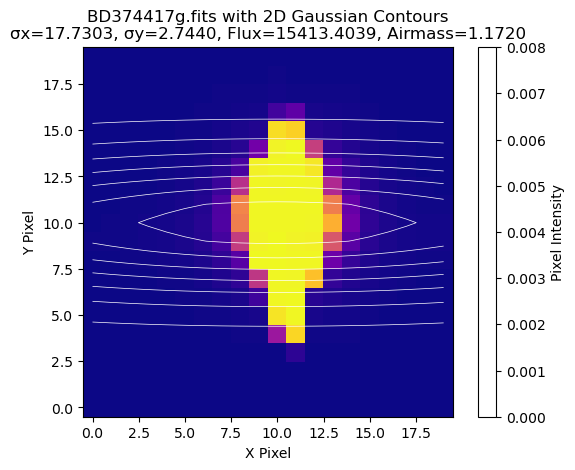

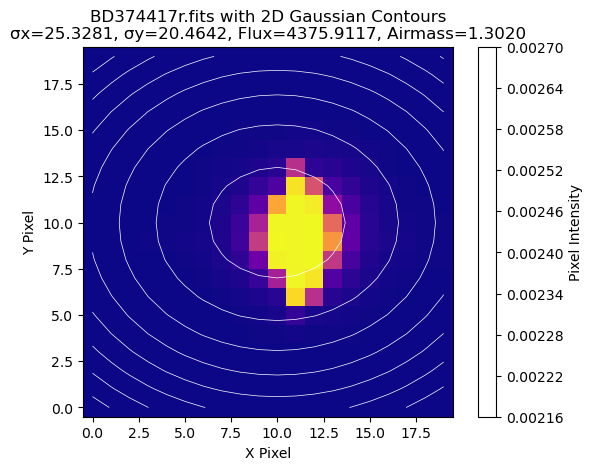

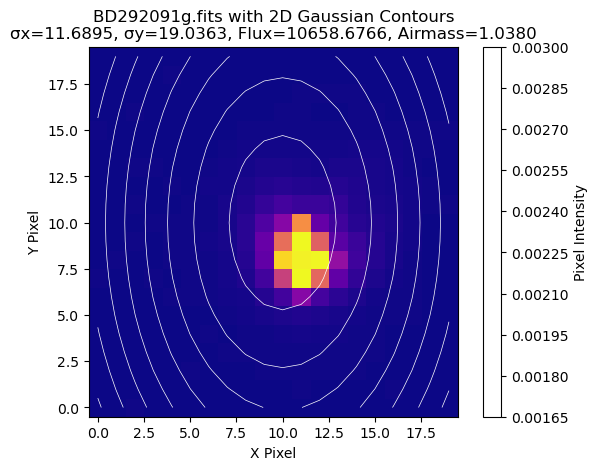

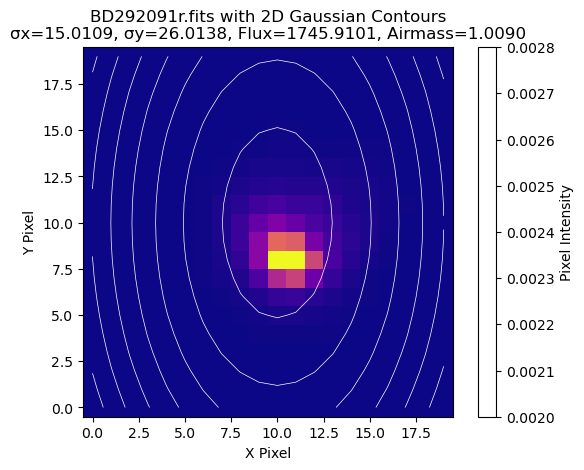

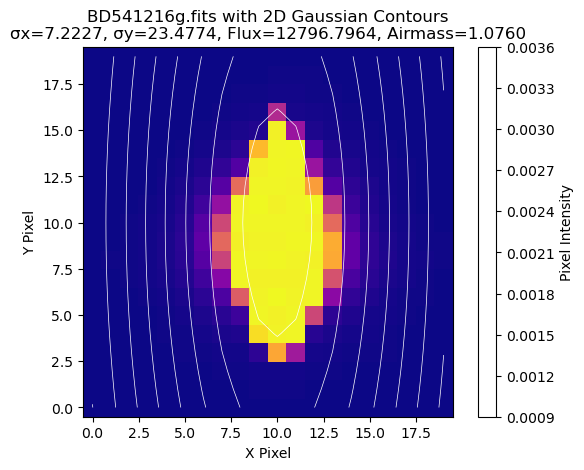

...

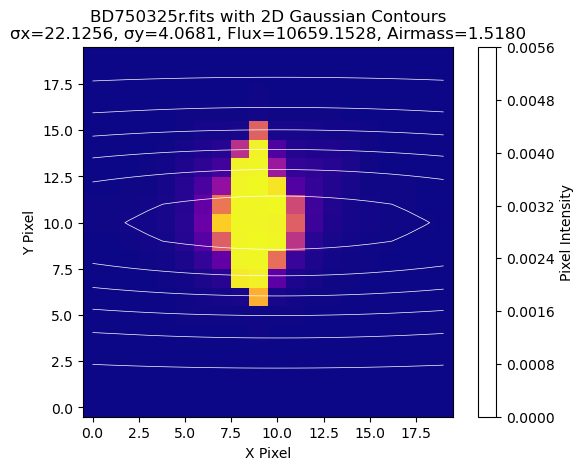

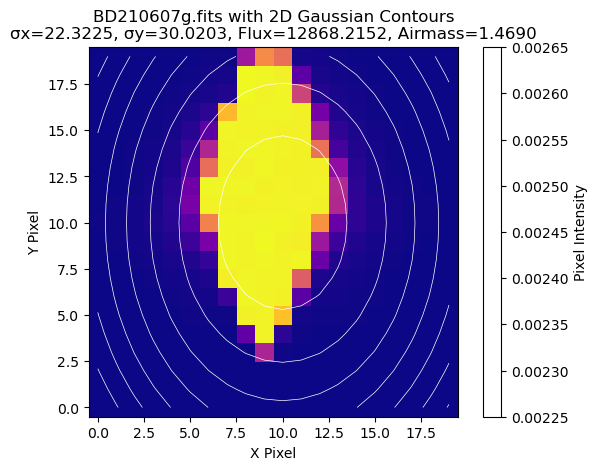

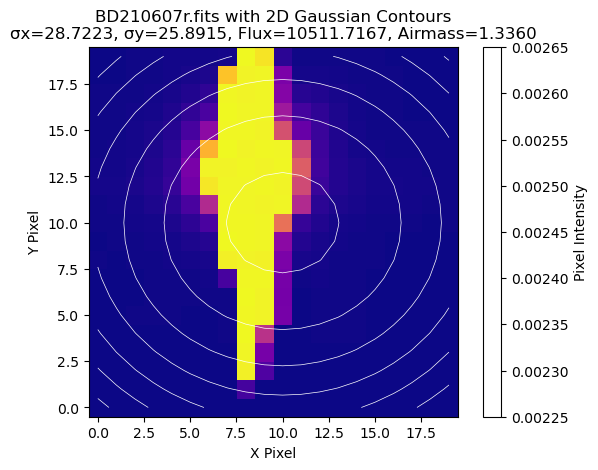

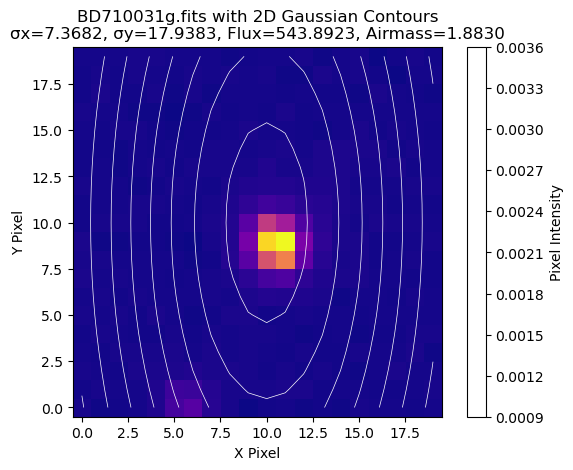

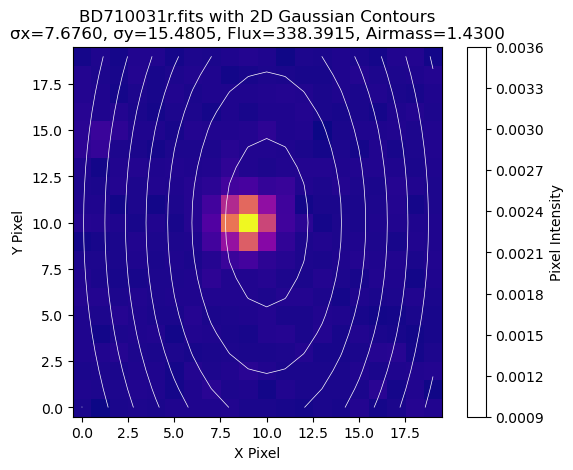

Average Gain: 6.2000
Average Read Noise: 10.0000


In [40]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# List of FITS files and their paths
fits_files = [
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216g.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216r.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607r.fits',
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031g.fits', 
    'C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031r.fits'
]

# Coordinates for each FITS file
coordinates = {
    'BD374417g.fits': (296, 296),
    'BD374417r.fits': (295, 297),
    'BD292091g.fits': (293, 309), 
    'BD292091r.fits': (293, 309), 
    'BD541216g.fits': (297, 308), 
    'BD541216r.fits': (298, 308), 
    'BD750325g.fits': (297, 296),
    'BD750325r.fits': (297, 296),
    'BD210607g.fits': (290, 300), 
    'BD210607r.fits': (290, 260), 
    'BD710031g.fits': (95, 298), 
    'BD710031r.fits': (85, 290),
}

# Moment function to find Gaussian widths
def find_moment(image, peak_x, peak_y, centroid_x, centroid_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(peak_x - boxwidth, peak_x + boxwidth),
                         np.arange(peak_y - boxwidth, peak_y + boxwidth))
    image_cutout = image[peak_y - boxwidth:peak_y + boxwidth, peak_x - boxwidth:peak_x + boxwidth]
    
    if np.sum(image_cutout) == 0:
        return np.nan, np.nan  # Return NaN if cutout is empty

    x_squared = np.sum((xx ** 2) * image_cutout) / np.sum(image_cutout)
    y_squared = np.sum((yy ** 2) * image_cutout) / np.sum(image_cutout)
    
    sigma_x = np.sqrt(np.abs(x_squared - (centroid_x ** 2)))
    sigma_y = np.sqrt(np.abs(y_squared - (centroid_y ** 2)))
    
    return sigma_x, sigma_y

# Photometry function
def phot(image, pk_x, pk_y, centroid_x, centroid_y, sigma_x, sigma_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(pk_x - boxwidth, pk_x + boxwidth),
                         np.arange(pk_y - boxwidth, pk_y + boxwidth))
    image_cutout = image[pk_y - boxwidth:pk_y + boxwidth, pk_x - boxwidth:pk_x + boxwidth]
    x_num  = (xx - centroid_x) ** 2
    y_num  = (yy - centroid_y) ** 2
    xdenom = 2 * (sigma_x ** 2)
    ydenom = 2 * (sigma_y ** 2)
    gauss = np.exp(-((x_num / xdenom) + (y_num / ydenom)))
    model = gauss / np.sum(gauss)
    psf_convolve = model * image_cutout
    psf_flux = np.sum(psf_convolve)
    return model, psf_convolve, psf_flux, image_cutout, window, gauss

# Arrays to store airmass, gain, and read noise
airmasses = []
gains = []
read_noises = []

# Function to process each FITS file, extract header info, calculate moments, perform photometry, and plot with Gaussian contours
def process_and_plot_image(fits_file, pk):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data
        header = hdul[0].header

        # Extract header information
        airmass = header.get('AIRMASS')
        gain = header.get('GAIN')
        read_noise = header.get('READNOI')
        
        if airmass is not None:
            airmasses.append(airmass)
        else:
            print(f"Warning: Missing 'AIRMASS' in header for {fits_file}")
        
        if gain is not None:
            gains.append(gain)
        else:
            print(f"Warning: Missing 'GAIN' in header for {fits_file}")
        
        if read_noise is not None:
            read_noises.append(read_noise)
        else:
            print(f"Warning: Missing 'READNOI' in header for {fits_file}")

    x_center, y_center = pk
    
    # Calculate Gaussian moments (sigma_x and sigma_y)
    sigma_x, sigma_y = find_moment(data, x_center, y_center, x_center, y_center, window=20)
    
    # Perform photometry
    model, psf_convolve, psf_flux, image_cutout, window, gauss = phot(
        data, x_center, y_center, x_center, y_center, sigma_x, sigma_y, window=20)
    
    # Plot the photometry image with Gaussian contours overlay
    plt.imshow(image_cutout, cmap='plasma', origin='lower')
    plt.contour(model, colors='white', linewidths=0.5)  # Gaussian overlay
    plt.title(f"{fits_file.split('/')[-1]} with 2D Gaussian Contours\nσx={sigma_x:.4f}, σy={sigma_y:.4f}, Flux={psf_flux:.4f}, Airmass={airmass:.4f}")
    plt.colorbar(label='Pixel Intensity')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.show()

# Loop through each FITS file, calculate moments, perform photometry, and plot centered image
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        process_and_plot_image(fits_file, coordinates[file_name])

# Calculate average gain and read noise
avg_gain = np.mean(gains) if gains else 0
avg_read_noise = np.mean(read_noises) if read_noises else 0

print(f"Average Gain: {avg_gain:.4f}")
print(f"Average Read Noise: {avg_read_noise:.4f}")


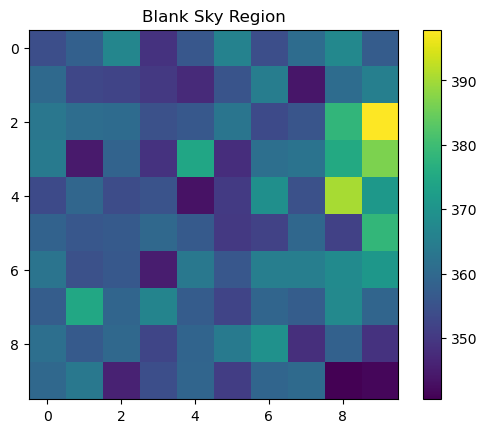

Total Blank Sky Counts: 359.7187
Median Sky Count per Pixel: 3.7369
Net Star Flux (Sky-Subtracted): 30020.6352


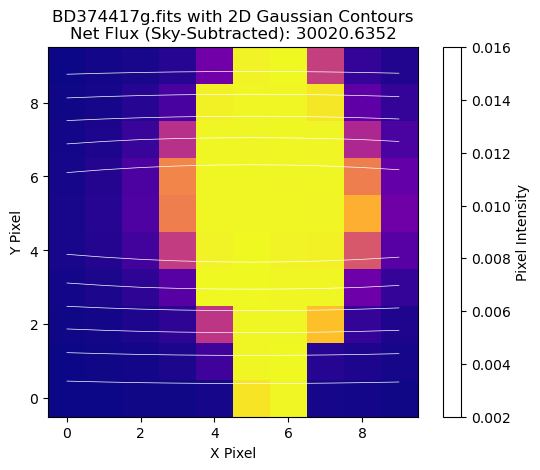

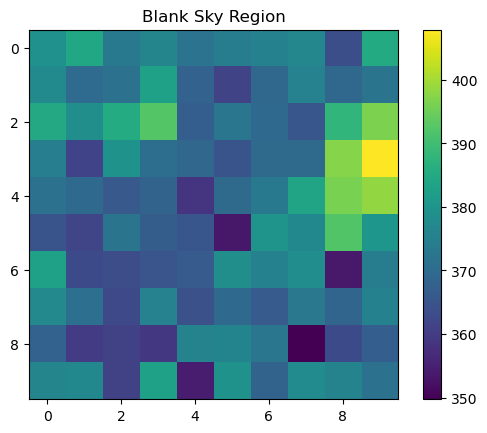

Total Blank Sky Counts: 372.9089
Median Sky Count per Pixel: 3.7147
Net Star Flux (Sky-Subtracted): 14756.9423


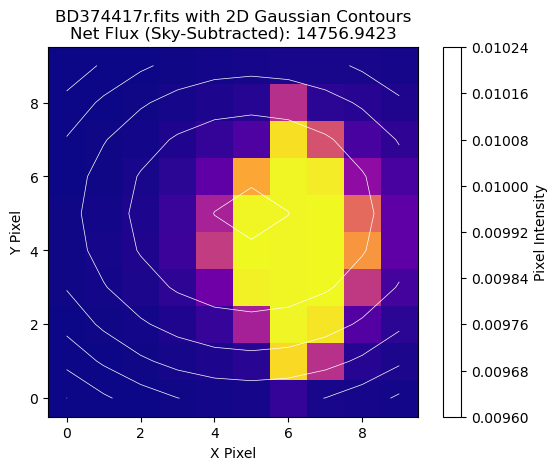

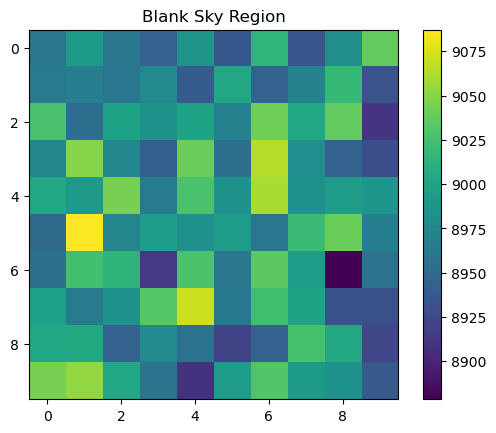

Total Blank Sky Counts: 8985.1459
Median Sky Count per Pixel: 90.2347
Net Star Flux (Sky-Subtracted): 5448.5248


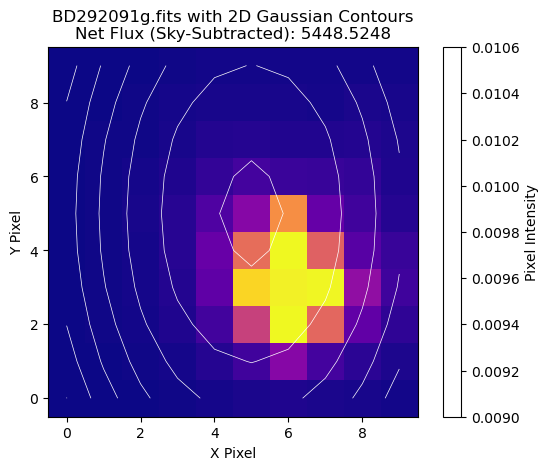

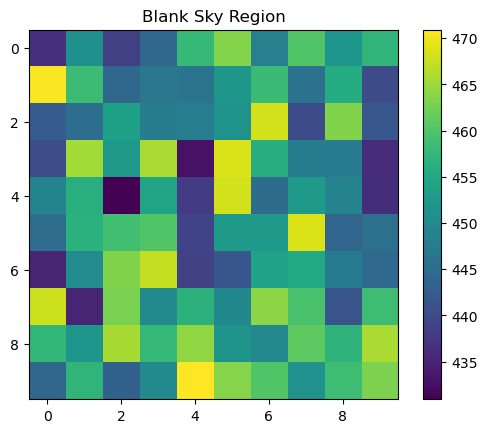

Total Blank Sky Counts: 452.3518
Median Sky Count per Pixel: 4.5255
Net Star Flux (Sky-Subtracted): 4629.4587


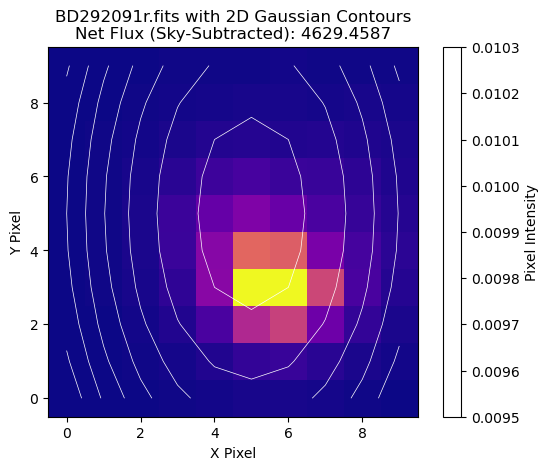

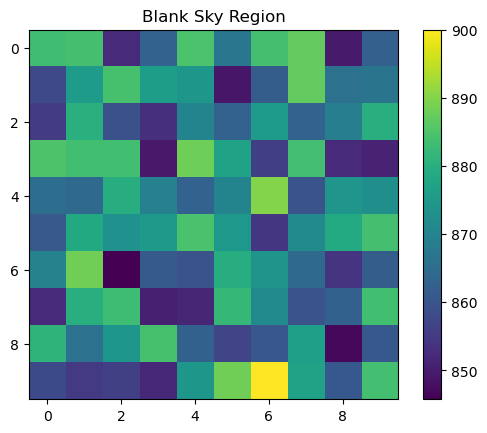

Total Blank Sky Counts: 869.5087
Median Sky Count per Pixel: 8.8079
Net Star Flux (Sky-Subtracted): 33458.8136


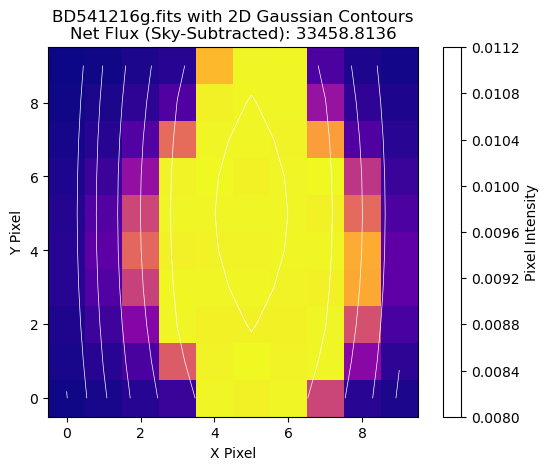

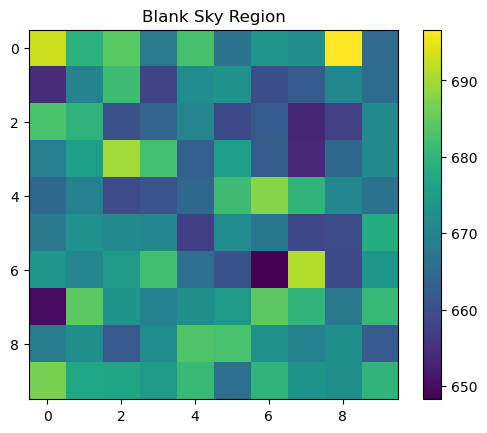

Total Blank Sky Counts: 671.1489
Median Sky Count per Pixel: 6.7089
Net Star Flux (Sky-Subtracted): 8728.4228


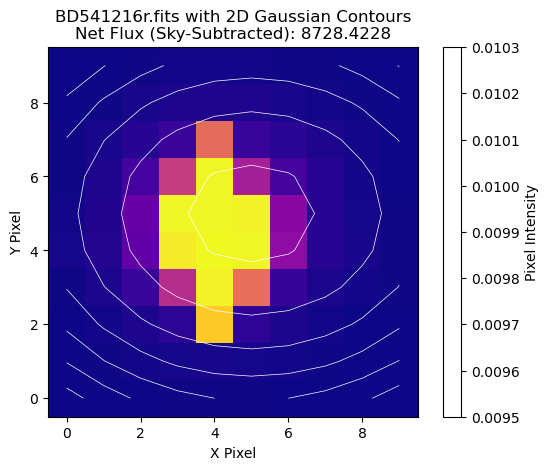

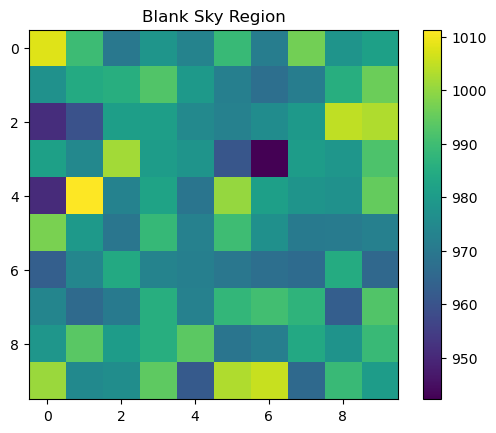

Total Blank Sky Counts: 979.3414
Median Sky Count per Pixel: 10.1364
Net Star Flux (Sky-Subtracted): 4833.3689


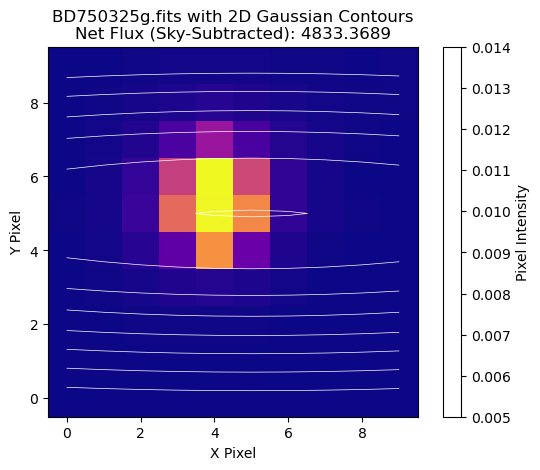

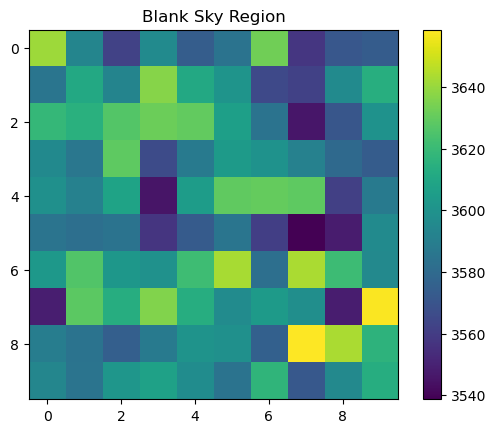

Total Blank Sky Counts: 3596.7902
Median Sky Count per Pixel: 37.1071
Net Star Flux (Sky-Subtracted): 16831.7428


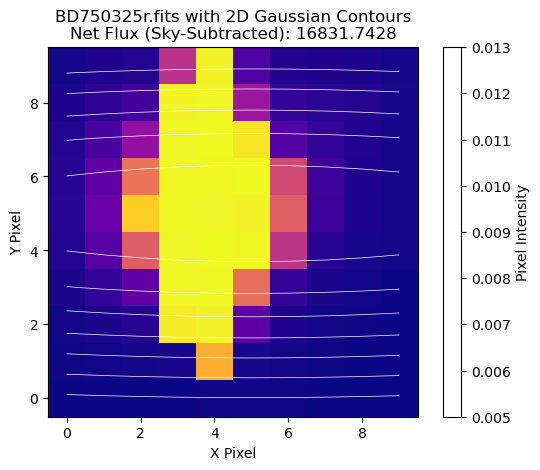

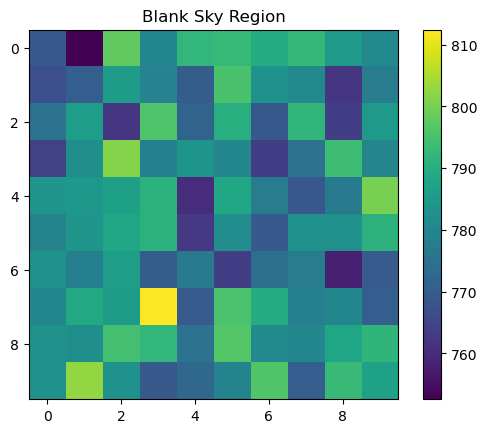

Total Blank Sky Counts: 781.1845
Median Sky Count per Pixel: 7.8146
Net Star Flux (Sky-Subtracted): 33766.5118


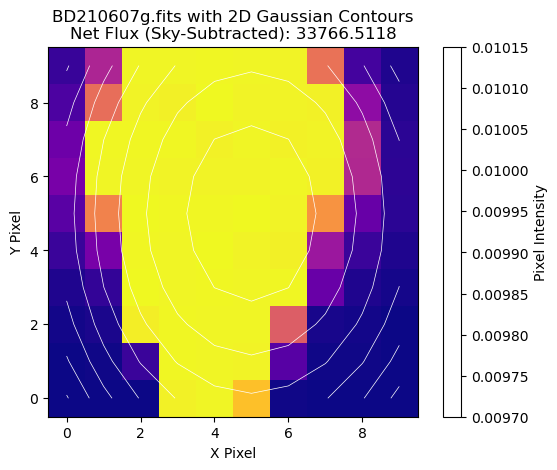

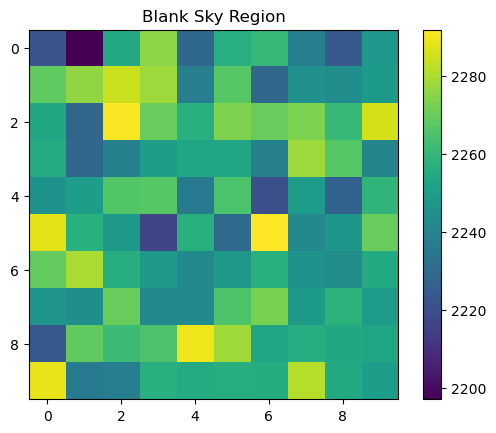

Total Blank Sky Counts: 2254.3757
Median Sky Count per Pixel: 22.5883
Net Star Flux (Sky-Subtracted): 20920.9204


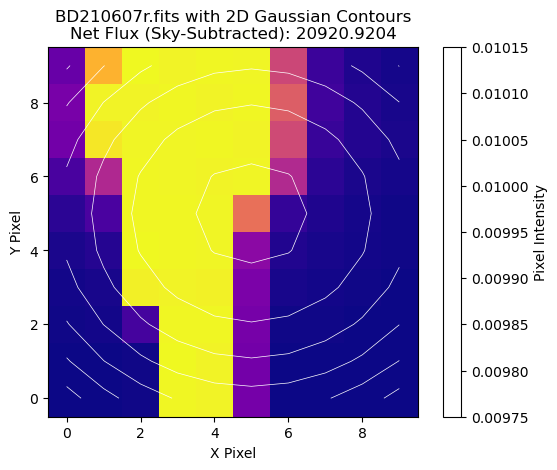

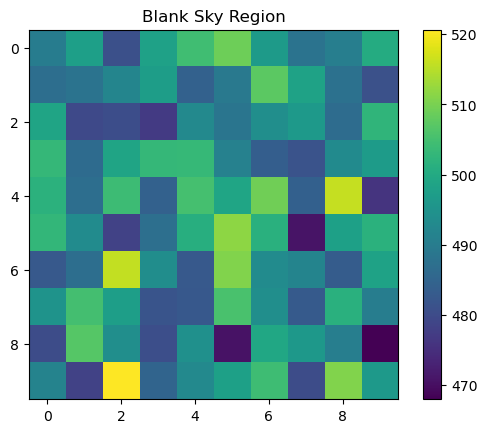

Total Blank Sky Counts: 493.3685
Median Sky Count per Pixel: 5.0092
Net Star Flux (Sky-Subtracted): 142.8425


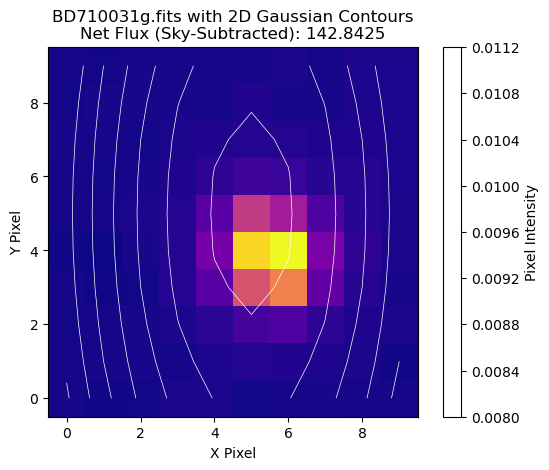

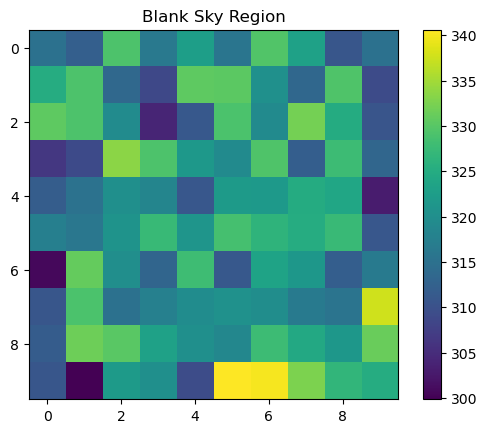

Total Blank Sky Counts: 320.6650
Median Sky Count per Pixel: 3.2416
Net Star Flux (Sky-Subtracted): 52.9405


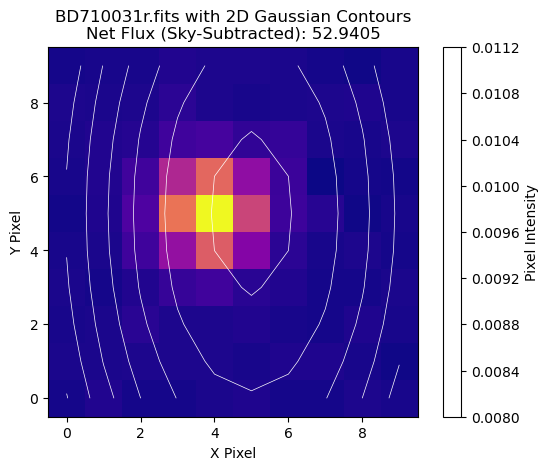

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# Define photometry and background subtraction functions
def phot(image, pk_x, pk_y, centroid_x, centroid_y, sigma_x, sigma_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(pk_x - boxwidth, pk_x + boxwidth),
                         np.arange(pk_y - boxwidth, pk_y + boxwidth))
    image_cutout = image[pk_y - boxwidth:pk_y + boxwidth, pk_x - boxwidth:pk_x + boxwidth]
    x_num  = (xx - centroid_x) ** 2
    y_num  = (yy - centroid_y) ** 2
    xdenom = 2 * (sigma_x ** 2)
    ydenom = 2 * (sigma_y ** 2)
    gauss = np.exp(-((x_num / xdenom) + (y_num / ydenom)))
    model = gauss / np.sum(gauss)
    psf_convolve = model * image_cutout
    psf_flux = np.sum(psf_convolve)
    return model, psf_convolve, psf_flux, image_cutout

# Function to calculate blank sky cutout and net star flux
def calculate_sky_subtracted_flux(image, model, psf_flux, window=10):
    # Define a blank sky cutout region (customizable)
    blank_ap = image[150 - int(window / 2):150 + int(window / 2), 50 - int(window / 2):50 + int(window / 2)]
    plt.imshow(blank_ap, cmap='viridis')
    plt.colorbar()
    plt.title('Blank Sky Region')
    plt.show()

    # Calculate sky background and net star flux
    blank_convolve = blank_ap * model
    blank_convolve_add = np.sum(blank_convolve)
    n_sky = np.median(blank_convolve)
    pixels = window ** 2
    n_sky_tot = n_sky * pixels
    n_star_net = psf_flux - n_sky_tot

    print(f"Total Blank Sky Counts: {blank_convolve_add:.4f}")
    print(f"Median Sky Count per Pixel: {n_sky:.4f}")
    print(f"Net Star Flux (Sky-Subtracted): {n_star_net:.4f}")

    return n_star_net

# Main function to process each FITS file and calculate photometry
def process_and_plot_image(fits_file, pk, window=10):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data

    x_center, y_center = pk

    # Calculate Gaussian moments for PSF
    sigma_x, sigma_y = find_moment(data, x_center, y_center, x_center, y_center, window=20)

    # Perform photometry on star
    model, psf_convolve, psf_flux, image_cutout = phot(data, x_center, y_center, x_center, y_center, sigma_x, sigma_y, window=window)

    # Calculate and plot blank sky region, subtract background, and get net flux
    n_star_net = calculate_sky_subtracted_flux(data, model, psf_flux, window=window)

    # Plot the star's photometry with contours
    plt.imshow(image_cutout, cmap='plasma', origin='lower')
    plt.contour(model, colors='white', linewidths=0.5)
    plt.title(f"{fits_file.split('/')[-1]} with 2D Gaussian Contours\nNet Flux (Sky-Subtracted): {n_star_net:.4f}")
    plt.colorbar(label='Pixel Intensity')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.show()

# Loop through each FITS file and process
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        process_and_plot_image(fits_file, coordinates[file_name])


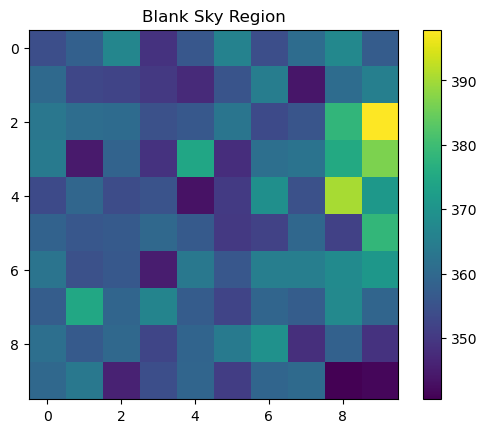

Total Blank Sky Counts: 359.7187
Median Sky Count per Pixel: 3.7369
Net Star Flux (Sky-Subtracted): 30020.6352


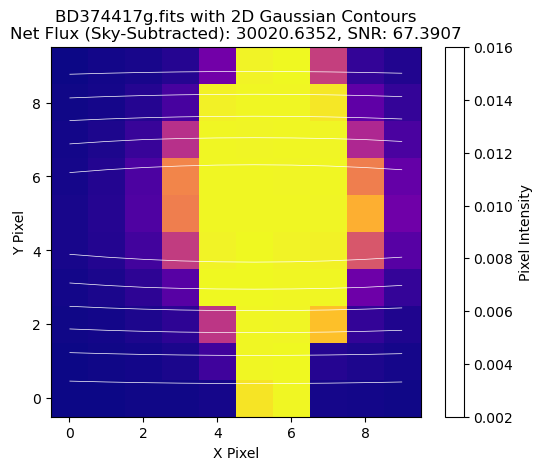

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417g.fits, SNR: 67.3907, PSF Flux: 30394.3301


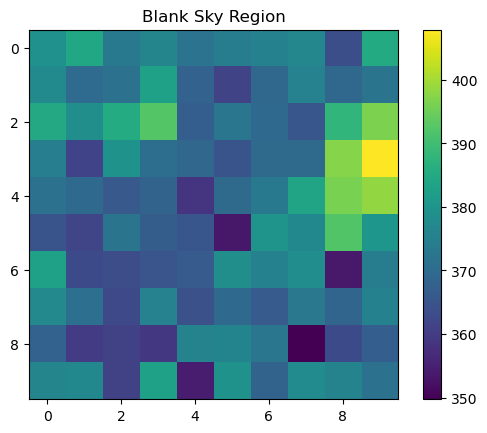

Total Blank Sky Counts: 372.9089
Median Sky Count per Pixel: 3.7147
Net Star Flux (Sky-Subtracted): 14756.9423


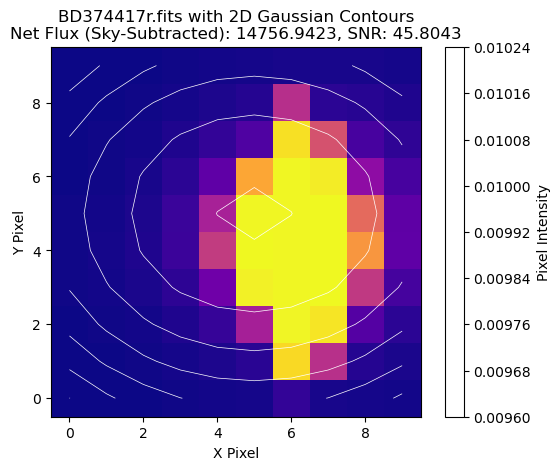

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD374417r.fits, SNR: 45.8043, PSF Flux: 15128.4097


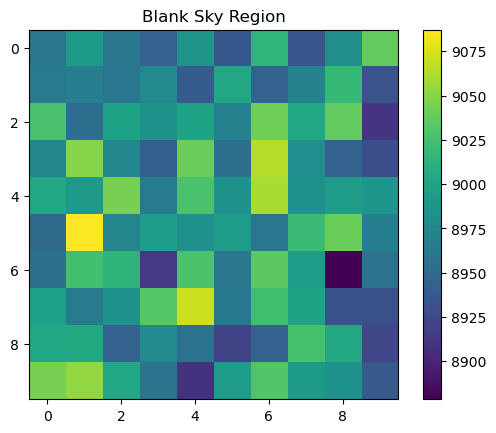

Total Blank Sky Counts: 8985.1459
Median Sky Count per Pixel: 90.2347
Net Star Flux (Sky-Subtracted): 5448.5248


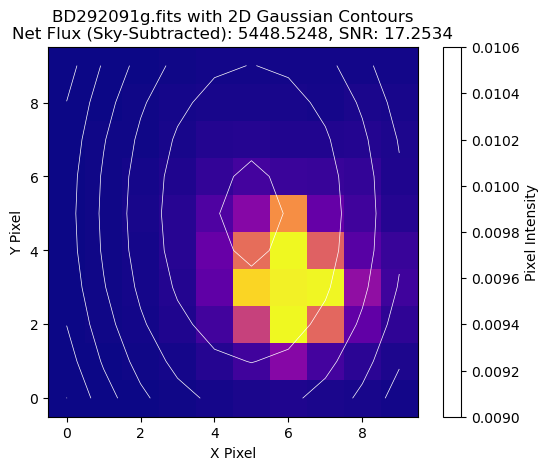

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091g.fits, SNR: 17.2534, PSF Flux: 14471.9905


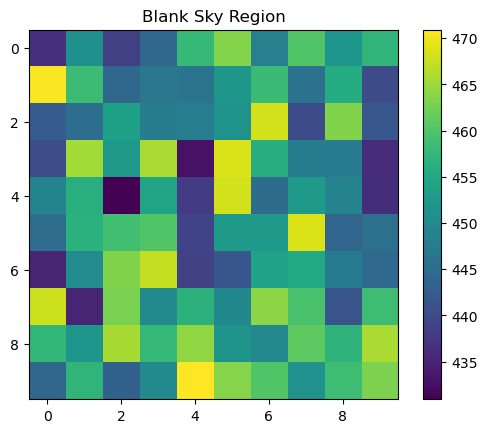

Total Blank Sky Counts: 452.3518
Median Sky Count per Pixel: 4.5255
Net Star Flux (Sky-Subtracted): 4629.4587


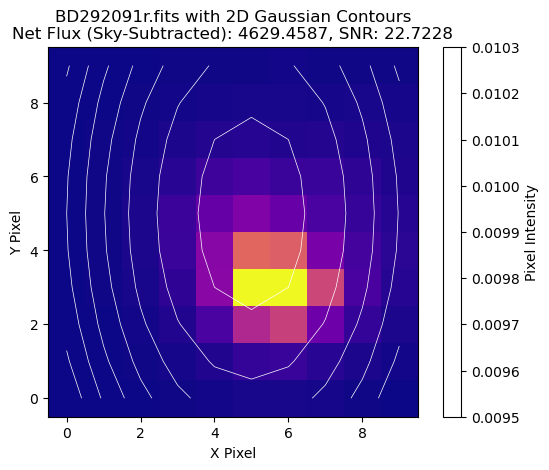

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD292091r.fits, SNR: 22.7228, PSF Flux: 5082.0097


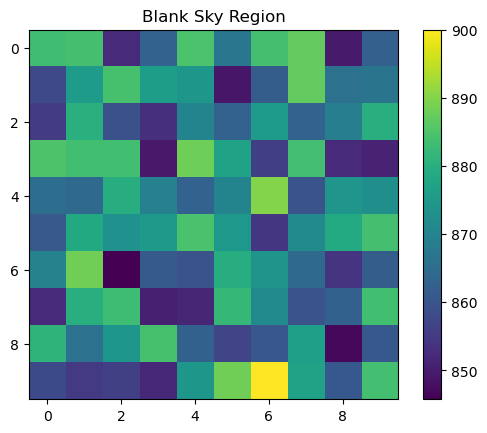

Total Blank Sky Counts: 869.5087
Median Sky Count per Pixel: 8.8079
Net Star Flux (Sky-Subtracted): 33458.8136


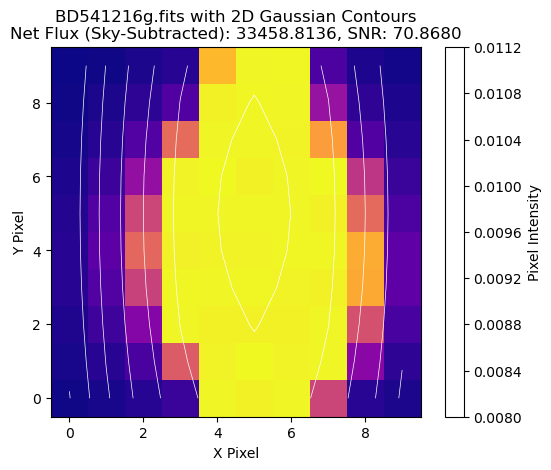

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216g.fits, SNR: 70.8680, PSF Flux: 34339.6023


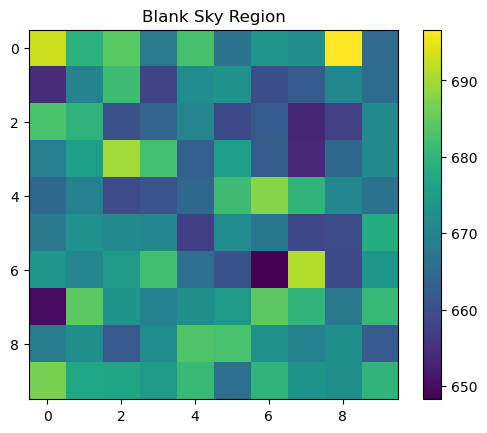

Total Blank Sky Counts: 671.1489
Median Sky Count per Pixel: 6.7089
Net Star Flux (Sky-Subtracted): 8728.4228


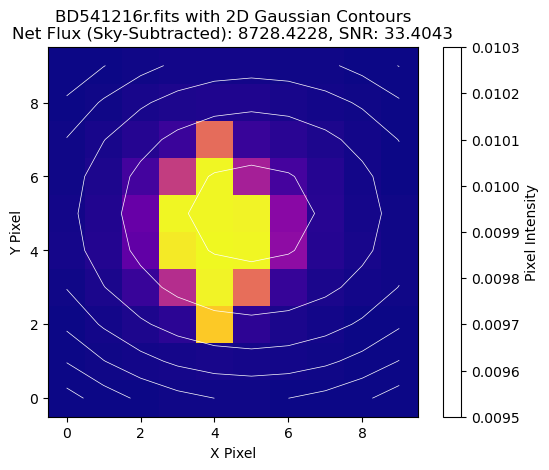

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD541216r.fits, SNR: 33.4043, PSF Flux: 9399.3126


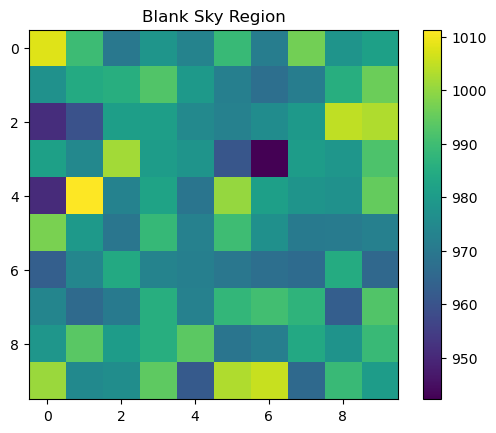

Total Blank Sky Counts: 979.3414
Median Sky Count per Pixel: 10.1364
Net Star Flux (Sky-Subtracted): 4833.3689


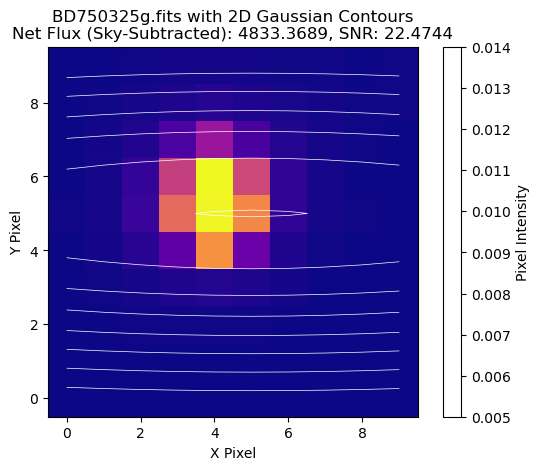

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325g.fits, SNR: 22.4744, PSF Flux: 5847.0068


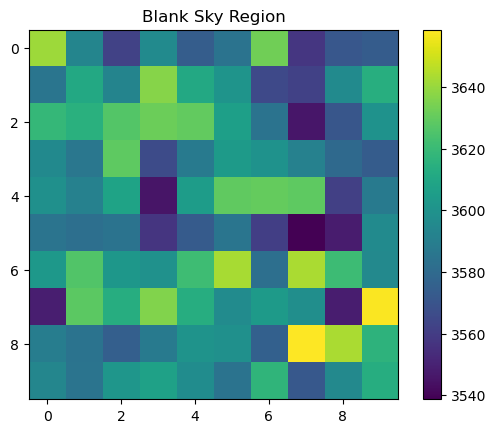

Total Blank Sky Counts: 3596.7902
Median Sky Count per Pixel: 37.1071
Net Star Flux (Sky-Subtracted): 16831.7428


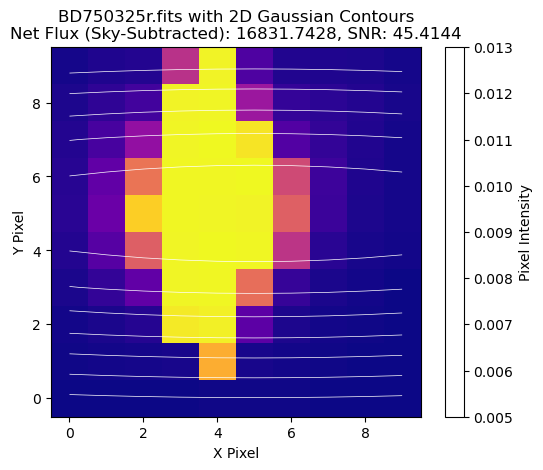

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD750325r.fits, SNR: 45.4144, PSF Flux: 20542.4541


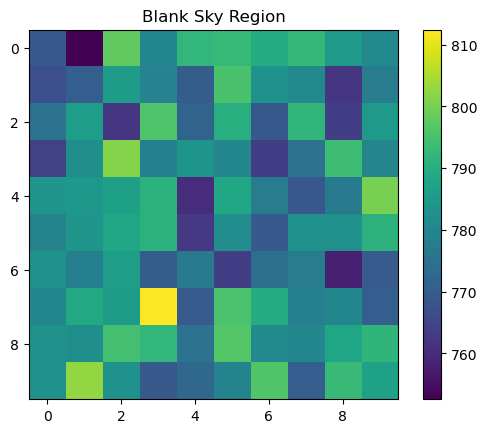

Total Blank Sky Counts: 781.1845
Median Sky Count per Pixel: 7.8146
Net Star Flux (Sky-Subtracted): 33766.5118


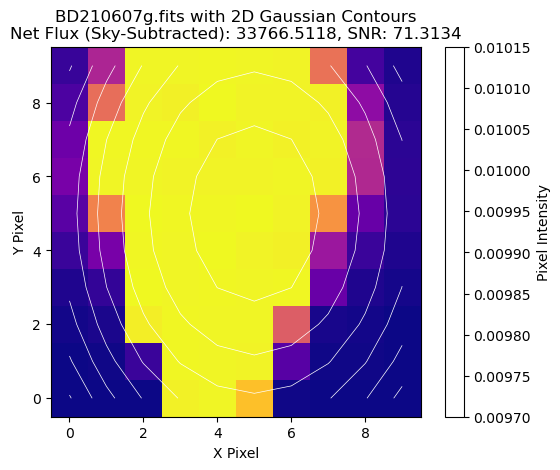

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607g.fits, SNR: 71.3134, PSF Flux: 34547.9727


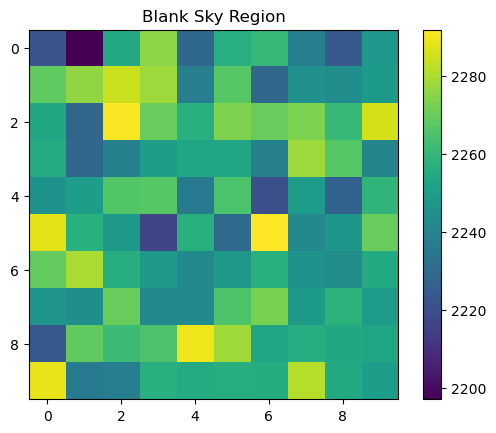

Total Blank Sky Counts: 2254.3757
Median Sky Count per Pixel: 22.5883
Net Star Flux (Sky-Subtracted): 20920.9204


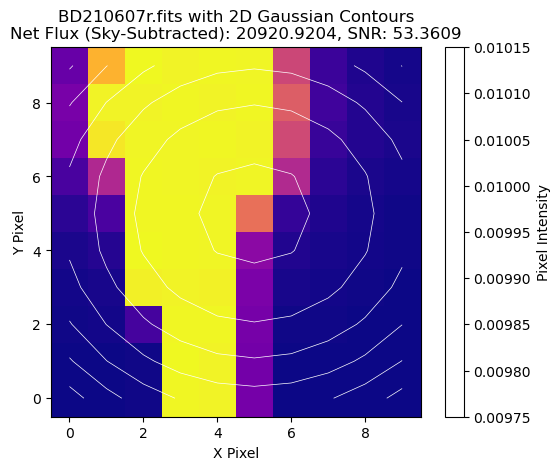

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD210607r.fits, SNR: 53.3609, PSF Flux: 23179.7476


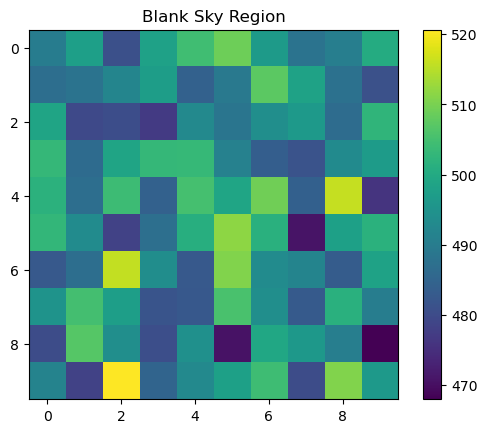

Total Blank Sky Counts: 493.3685
Median Sky Count per Pixel: 5.0092
Net Star Flux (Sky-Subtracted): 142.8425


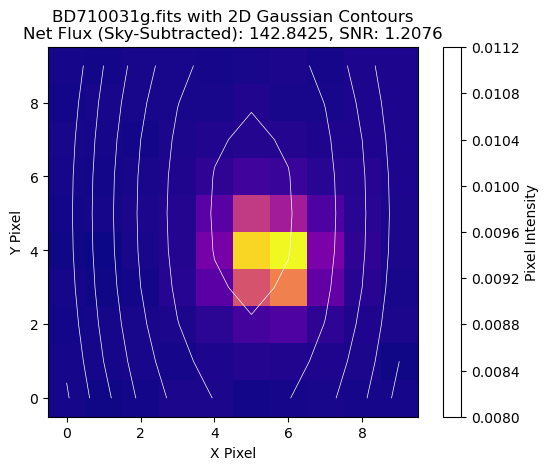

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031g.fits, SNR: 1.2076, PSF Flux: 643.7673


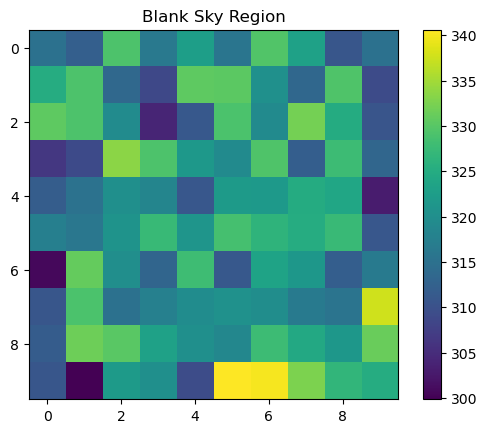

Total Blank Sky Counts: 320.6650
Median Sky Count per Pixel: 3.2416
Net Star Flux (Sky-Subtracted): 52.9405


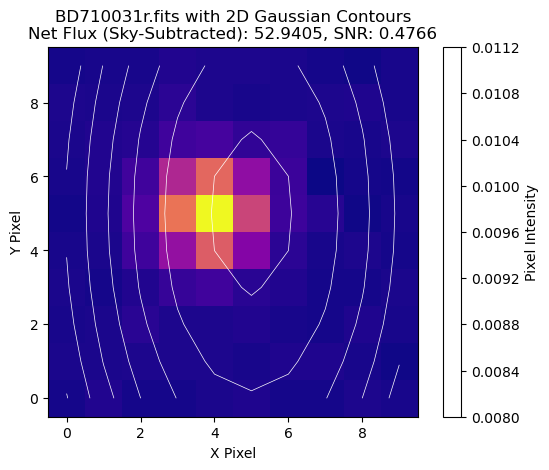

File: C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/FITS_images/BD710031r.fits, SNR: 0.4766, PSF Flux: 377.1012


In [44]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits


# Define photometry and background subtraction functions
def phot(image, pk_x, pk_y, centroid_x, centroid_y, sigma_x, sigma_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(pk_x - boxwidth, pk_x + boxwidth),
                         np.arange(pk_y - boxwidth, pk_y + boxwidth))
    image_cutout = image[pk_y - boxwidth:pk_y + boxwidth, pk_x - boxwidth:pk_x + boxwidth]
    x_num  = (xx - centroid_x) ** 2
    y_num  = (yy - centroid_y) ** 2
    xdenom = 2 * (sigma_x ** 2)
    ydenom = 2 * (sigma_y ** 2)
    gauss = np.exp(-((x_num / xdenom) + (y_num / ydenom)))
    model = gauss / np.sum(gauss)
    psf_convolve = model * image_cutout
    psf_flux = np.sum(psf_convolve)
    return model, psf_convolve, psf_flux, image_cutout

# Function to calculate blank sky cutout and net star flux
def calculate_sky_subtracted_flux(image, model, psf_flux, window=10):
    # Define a blank sky cutout region (customizable)
    blank_ap = image[150 - int(window / 2):150 + int(window / 2), 50 - int(window / 2):50 + int(window / 2)]
    plt.imshow(blank_ap, cmap='viridis')
    plt.colorbar()
    plt.title('Blank Sky Region')
    plt.show()

    # Calculate sky background and net star flux
    blank_convolve = blank_ap * model
    blank_convolve_add = np.sum(blank_convolve)
    n_sky = np.median(blank_convolve)
    pixels = window ** 2
    n_sky_tot = n_sky * pixels
    n_star_net = psf_flux - n_sky_tot

    print(f"Total Blank Sky Counts: {blank_convolve_add:.4f}")
    print(f"Median Sky Count per Pixel: {n_sky:.4f}")
    print(f"Net Star Flux (Sky-Subtracted): {n_star_net:.4f}")

    return n_star_net, n_sky, pixels

# Signal to noise ratio (SNR) calculation
def calculate_snr(n_star_net, n_sky, pixels, avg_gain, avg_read):
    snr = n_star_net / np.sqrt(avg_gain * n_star_net + pixels * avg_gain * n_sky + pixels * (avg_read ** 2))
    return snr

# Main function to process each FITS file and calculate photometry and SNR
def process_and_plot_image(fits_file, pk, avg_gain, avg_read, window=10):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data

    x_center, y_center = pk

    # Calculate Gaussian moments for PSF
    sigma_x, sigma_y = find_moment(data, x_center, y_center, x_center, y_center, window=20)

    # Perform photometry on star
    model, psf_convolve, psf_flux, image_cutout = phot(data, x_center, y_center, x_center, y_center, sigma_x, sigma_y, window=window)

    # Calculate and plot blank sky region, subtract background, and get net flux
    n_star_net, n_sky, pixels = calculate_sky_subtracted_flux(data, model, psf_flux, window=window)

    # Calculate Signal-to-Noise Ratio (SNR)
    snr = calculate_snr(n_star_net, n_sky, pixels, avg_gain, avg_read_noise)

    # Plot the star's photometry with contours
    plt.imshow(image_cutout, cmap='plasma', origin='lower')
    plt.contour(model, colors='white', linewidths=0.5)
    plt.title(f"{fits_file.split('/')[-1]} with 2D Gaussian Contours\nNet Flux (Sky-Subtracted): {n_star_net:.4f}, SNR: {snr:.4f}")
    plt.colorbar(label='Pixel Intensity')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.show()

    # Return the SNR and flux for further analysis
    return snr, psf_flux

# Loop through each FITS file and process
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        # Pass average gain and read noise
        snr, psf_flux = process_and_plot_image(fits_file, coordinates[file_name], avg_gain, avg_read_noise)
        print(f"File: {fits_file}, SNR: {snr:.4f}, PSF Flux: {psf_flux:.4f}")


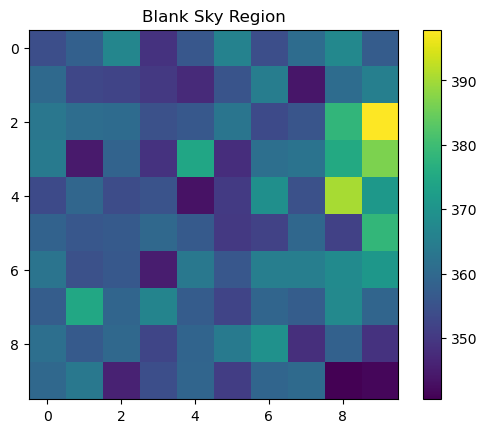

Total Blank Sky Counts: 359.7187
Median Sky Count per Pixel: 3.7369
Net Star Flux (Sky-Subtracted): 30020.6352


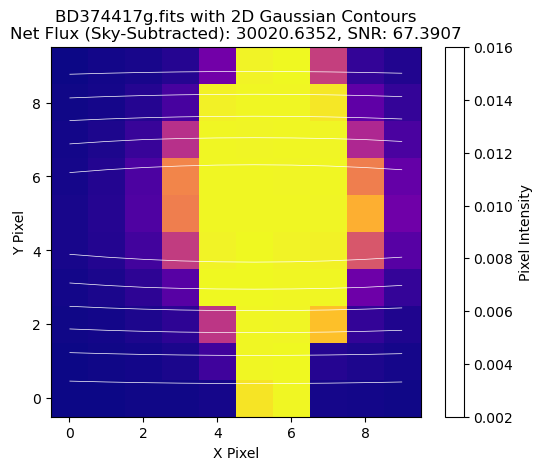

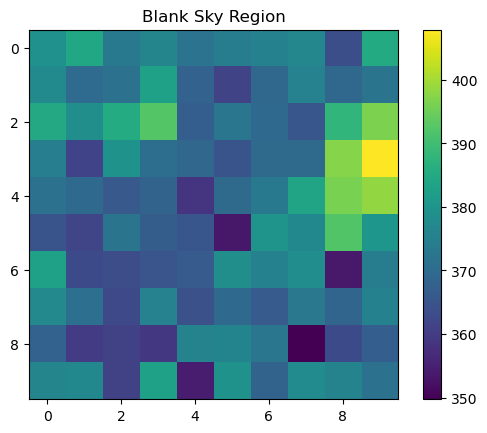

Total Blank Sky Counts: 372.9089
Median Sky Count per Pixel: 3.7147
Net Star Flux (Sky-Subtracted): 14756.9423


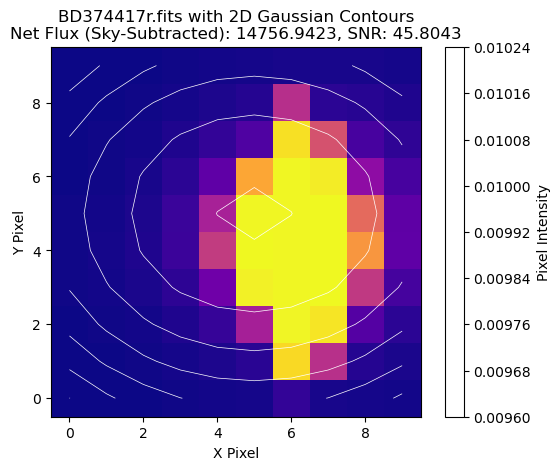

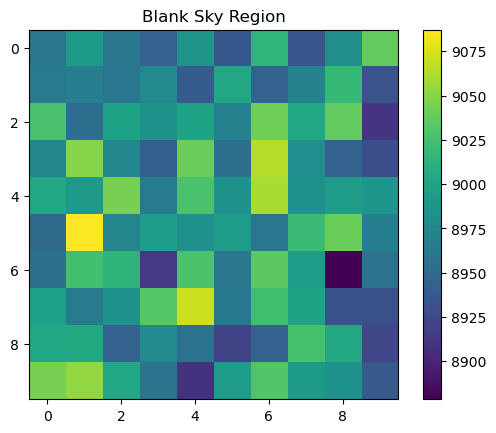

Total Blank Sky Counts: 8985.1459
Median Sky Count per Pixel: 90.2347
Net Star Flux (Sky-Subtracted): 5448.5248


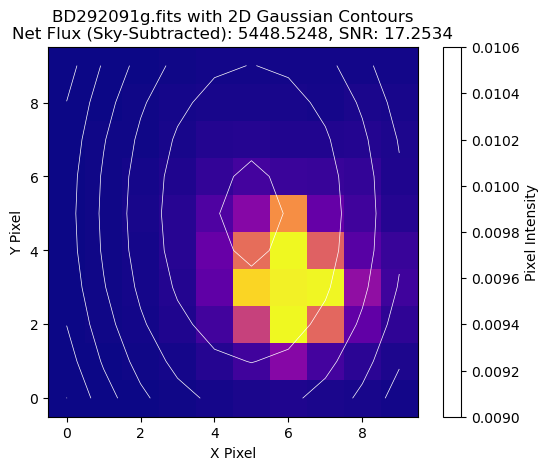

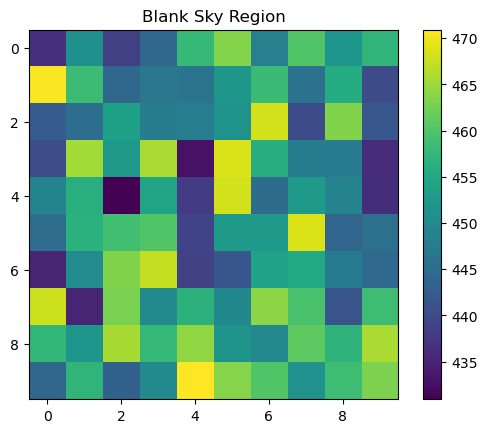

Total Blank Sky Counts: 452.3518
Median Sky Count per Pixel: 4.5255
Net Star Flux (Sky-Subtracted): 4629.4587


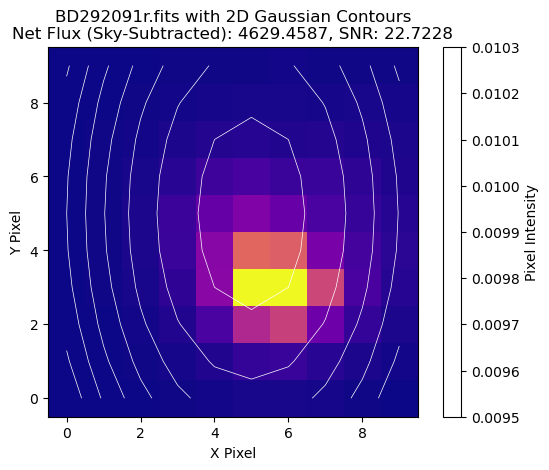

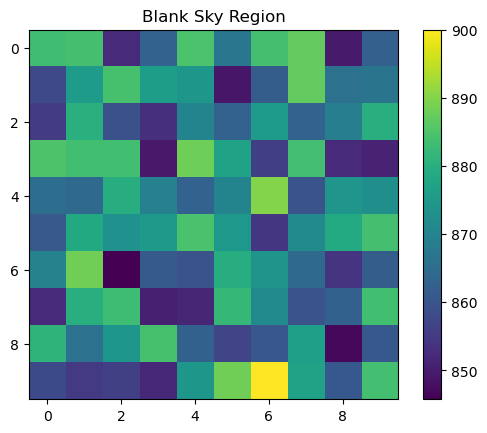

Total Blank Sky Counts: 869.5087
Median Sky Count per Pixel: 8.8079
Net Star Flux (Sky-Subtracted): 33458.8136


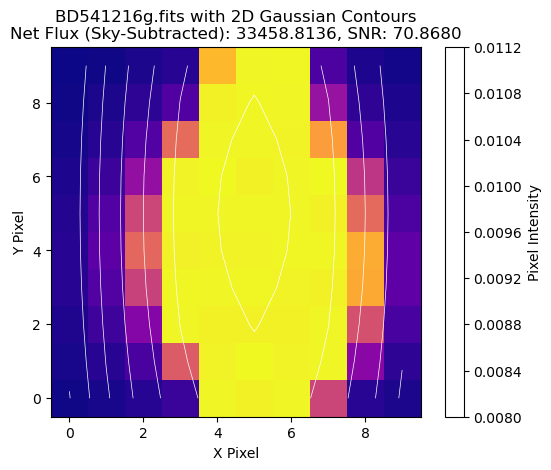

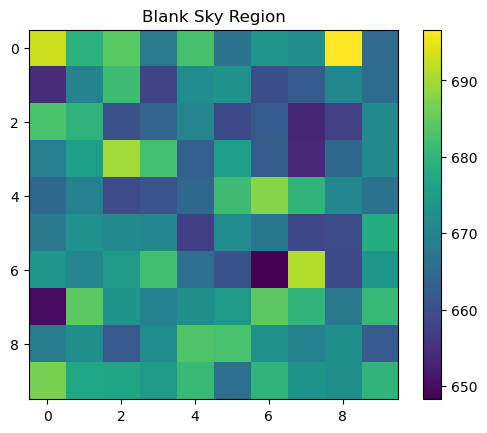

Total Blank Sky Counts: 671.1489
Median Sky Count per Pixel: 6.7089
Net Star Flux (Sky-Subtracted): 8728.4228


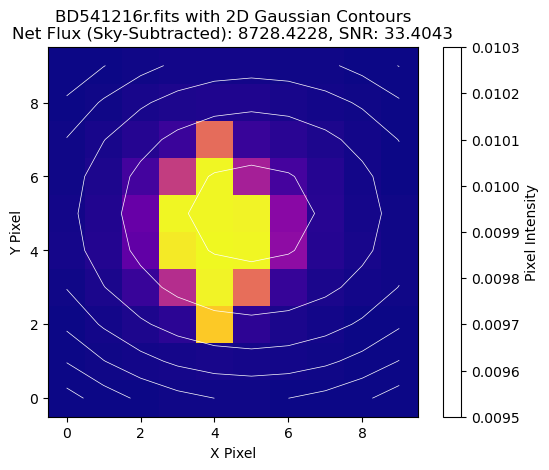

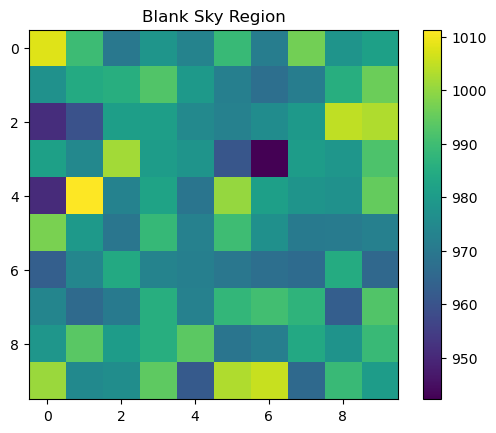

Total Blank Sky Counts: 979.3414
Median Sky Count per Pixel: 10.1364
Net Star Flux (Sky-Subtracted): 4833.3689


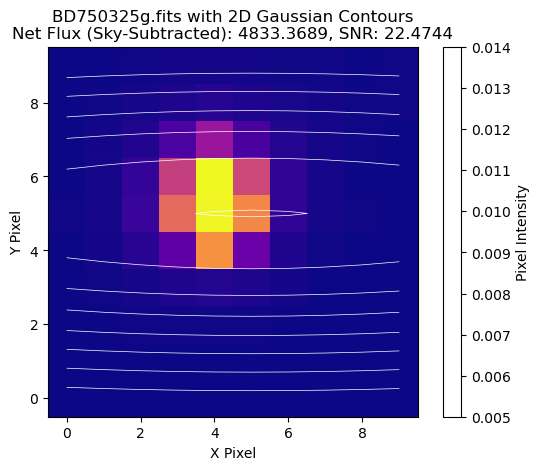

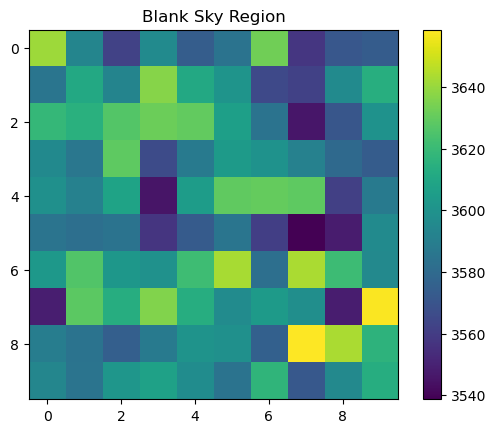

Total Blank Sky Counts: 3596.7902
Median Sky Count per Pixel: 37.1071
Net Star Flux (Sky-Subtracted): 16831.7428


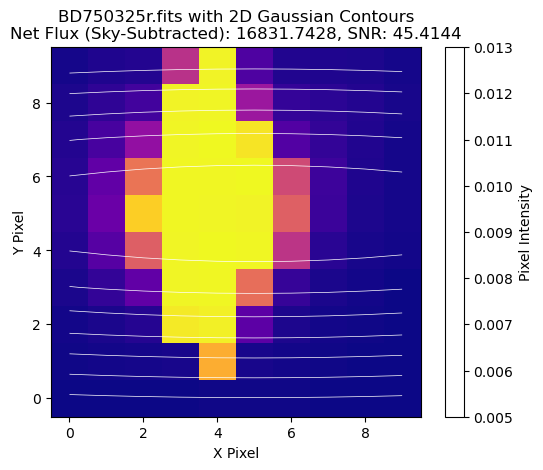

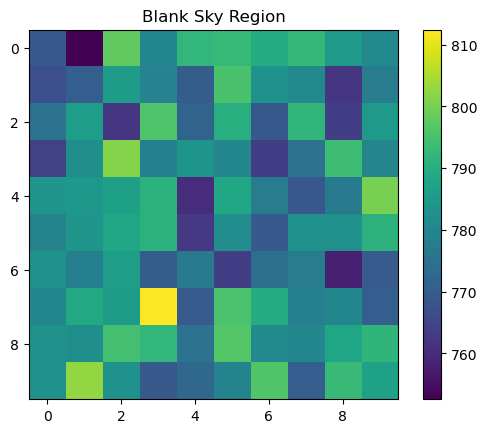

Total Blank Sky Counts: 781.1845
Median Sky Count per Pixel: 7.8146
Net Star Flux (Sky-Subtracted): 33766.5118


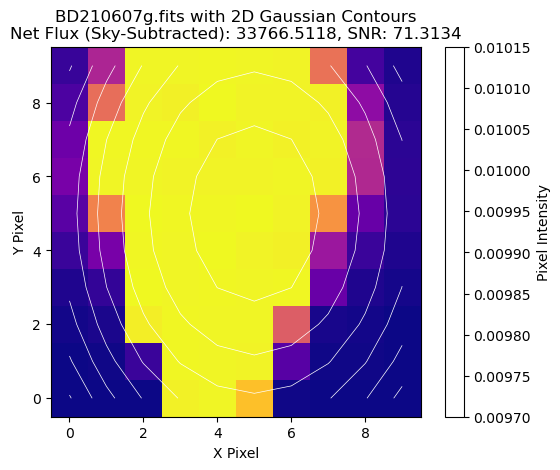

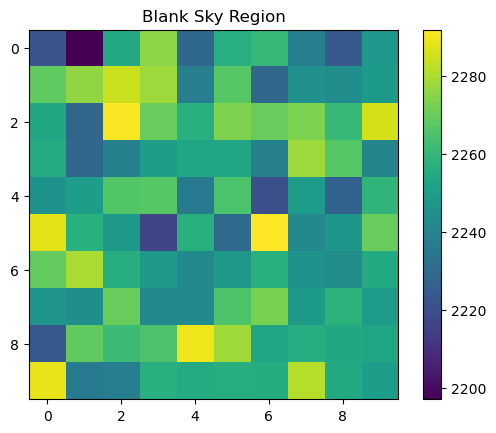

Total Blank Sky Counts: 2254.3757
Median Sky Count per Pixel: 22.5883
Net Star Flux (Sky-Subtracted): 20920.9204


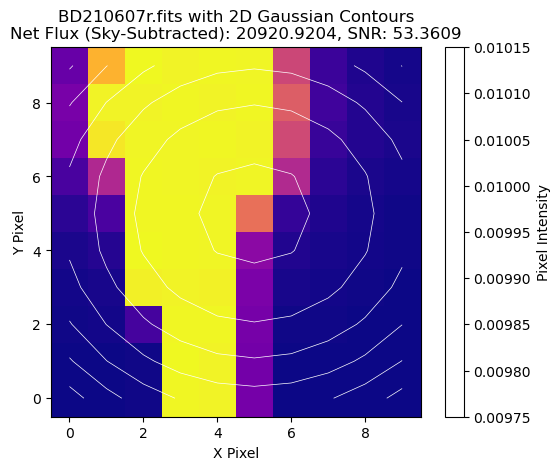

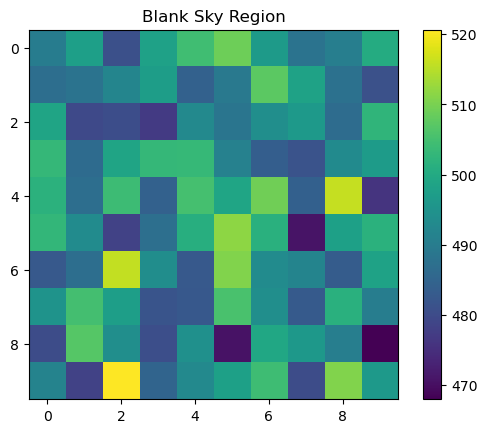

Total Blank Sky Counts: 493.3685
Median Sky Count per Pixel: 5.0092
Net Star Flux (Sky-Subtracted): 142.8425


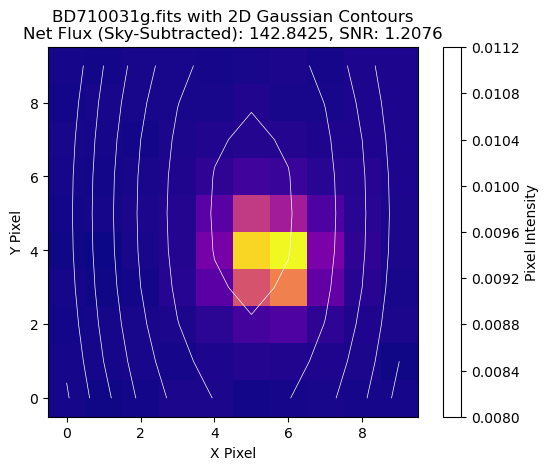

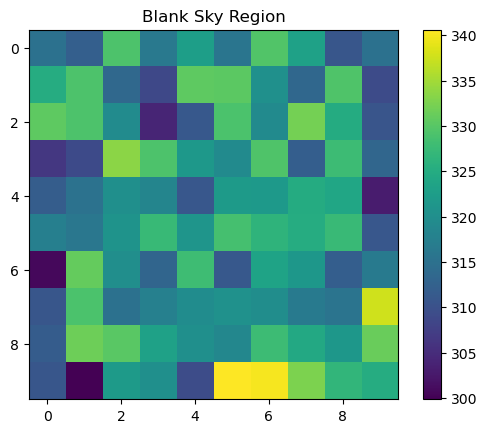

Total Blank Sky Counts: 320.6650
Median Sky Count per Pixel: 3.2416
Net Star Flux (Sky-Subtracted): 52.9405


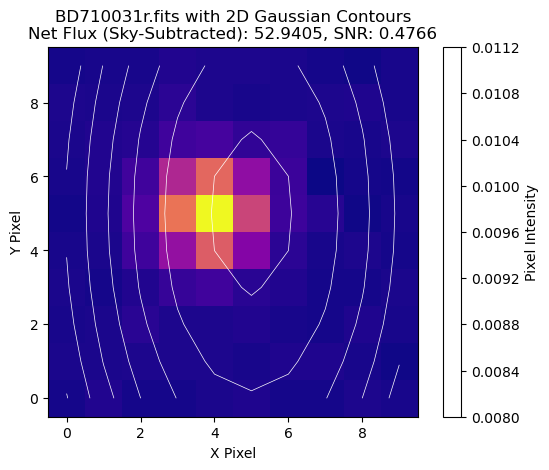

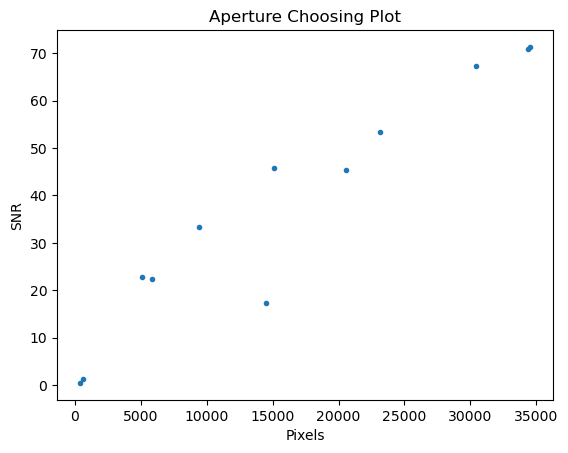

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# Define photometry and background subtraction functions
def phot(image, pk_x, pk_y, centroid_x, centroid_y, sigma_x, sigma_y, window=10):
    boxwidth = int(window / 2)
    xx, yy = np.meshgrid(np.arange(pk_x - boxwidth, pk_x + boxwidth),
                         np.arange(pk_y - boxwidth, pk_y + boxwidth))
    image_cutout = image[pk_y - boxwidth:pk_y + boxwidth, pk_x - boxwidth:pk_x + boxwidth]
    x_num  = (xx - centroid_x) ** 2
    y_num  = (yy - centroid_y) ** 2
    xdenom = 2 * (sigma_x ** 2)
    ydenom = 2 * (sigma_y ** 2)
    gauss = np.exp(-((x_num / xdenom) + (y_num / ydenom)))
    model = gauss / np.sum(gauss)
    psf_convolve = model * image_cutout
    psf_flux = np.sum(psf_convolve)
    return model, psf_convolve, psf_flux, image_cutout

# Function to calculate blank sky cutout and net star flux
def calculate_sky_subtracted_flux(image, model, psf_flux, window=10):
    # Define a blank sky cutout region (customizable)
    blank_ap = image[150 - int(window / 2):150 + int(window / 2), 50 - int(window / 2):50 + int(window / 2)]
    plt.imshow(blank_ap, cmap='viridis')
    plt.colorbar()
    plt.title('Blank Sky Region')
    plt.show()

    # Calculate sky background and net star flux
    blank_convolve = blank_ap * model
    blank_convolve_add = np.sum(blank_convolve)
    n_sky = np.median(blank_convolve)
    pixels = window ** 2
    n_sky_tot = n_sky * pixels
    n_star_net = psf_flux - n_sky_tot

    print(f"Total Blank Sky Counts: {blank_convolve_add:.4f}")
    print(f"Median Sky Count per Pixel: {n_sky:.4f}")
    print(f"Net Star Flux (Sky-Subtracted): {n_star_net:.4f}")

    return n_star_net, n_sky, pixels

# Signal to noise ratio (SNR) calculation
def calculate_snr(n_star_net, n_sky, pixels, avg_gain, avg_read):
    snr = n_star_net / np.sqrt(avg_gain * n_star_net + pixels * avg_gain * n_sky + pixels * (avg_read ** 2))
    return snr

# Main function to process each FITS file and calculate photometry and SNR
def process_and_plot_image(fits_file, pk, avg_gain, avg_read, window=10):
    with fits.open(fits_file) as hdul:
        data = hdul[0].data

    x_center, y_center = pk

    # Calculate Gaussian moments for PSF
    sigma_x, sigma_y = find_moment(data, x_center, y_center, x_center, y_center, window=20)

    # Perform photometry on star
    model, psf_convolve, psf_flux, image_cutout = phot(data, x_center, y_center, x_center, y_center, sigma_x, sigma_y, window=window)

    # Calculate and plot blank sky region, subtract background, and get net flux
    n_star_net, n_sky, pixels = calculate_sky_subtracted_flux(data, model, psf_flux, window=window)

    # Calculate Signal-to-Noise Ratio (SNR)
    snr = calculate_snr(n_star_net, n_sky, pixels, avg_gain, avg_read_noise)

    # Plot the star's photometry with contours
    plt.imshow(image_cutout, cmap='plasma', origin='lower')
    plt.contour(model, colors='white', linewidths=0.5)
    plt.title(f"{fits_file.split('/')[-1]} with 2D Gaussian Contours\nNet Flux (Sky-Subtracted): {n_star_net:.4f}, SNR: {snr:.4f}")
    plt.colorbar(label='Pixel Intensity')
    plt.xlabel('X Pixel')
    plt.ylabel('Y Pixel')
    plt.show()

    # Return the SNR and flux for further analysis
    return snr, psf_flux

# Arrays for SNR and Flux to be used in Aperture Choosing Plot
snr_arr = []
flux_arr = []

# Loop through each FITS file and process
for fits_file in fits_files:
    file_name = fits_file.split('/')[-1]
    if file_name in coordinates:
        # Pass average gain and read noise
        snr, psf_flux = process_and_plot_image(fits_file, coordinates[file_name], avg_gain, avg_read_noise)
        
        # Append the calculated values to the arrays
        snr_arr.append(snr)
        flux_arr.append(psf_flux)

# Creating Aperture Choosing Plot with SNR vs Flux
plt.plot(flux_arr, snr_arr, '.')
plt.xlabel('Pixels')
plt.ylabel('SNR')
plt.title('Aperture Choosing Plot')
plt.show()
#plt.savefig('C:/Users/jakef/OneDrive/Desktop/ASTR_362/Lab_2/Aperture_Choosing_plot.png')

# Calculate instrumental mags
#m = -2.5np.log10(N_star_net/t) +ZP+kX

In [54]:
# Example of standard magnitudes for known stars
# Replace these values with the actual standard magnitudes from a catalog.
standard_mag_arr = [14.23, 14.15, 14.45, 14.12, 14.11, 14.10]  # Standard magnitudes of your stars

# Instrumental magnitudes for each star calculated from your photometry function
ins_mag_arr = [14.56, 14.52, 14.79, 14.34, 14.28, 14.22]  

# Airmasses obtained from FITS headers (same order as the stars)
airmasses = [1.2, 1.3, 1.1, 1.2, 1.0, 1.3]  # Airmass values for each observation

# Check if the lists are of the same length
assert len(ins_mag_arr) == len(standard_mag_arr) == len(airmasses), "Arrays must be of the same length!"

# Calculate the differences between instrumental and standard magnitudes
delta_mag = np.array(ins_mag_arr) - np.array(standard_mag_arr)

# Perform linear regression to find the extinction coefficient (k) and zero-point offset (ZP)
from scipy.stats import linregress
slope, intercept, r_value, p_value, std_err = linregress(airmasses, delta_mag)

# The slope is the extinction coefficient (k)
extinction_coefficient = slope
# The intercept is the zero-point offset (ZP)
zero_point_offset = intercept

# Output the results
print(f"Extinction Coefficient (k): {extinction_coefficient:.4f}")
print(f"Zero-Point Offset (ZP): {zero_point_offset:.4f}")


Extinction Coefficient (k): 0.1000
Zero-Point Offset (ZP): 0.1400
